# LoMo E-commerce Case Challenge

Import Libraries and Dataset

In [138]:
# Import Libraries
import numpy as np
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt

In [139]:
# Import All Data
df_customers = pd.read_csv("/content/001_lomo_customers_dataset.csv")
df_sellers = pd.read_csv("/content/002_lomo_sellers_dataset.csv")
df_geolocation = pd.read_csv("/content/003_lomo_geolocation_dataset.csv")
df_products = pd.read_csv("/content/004_lomo_products_dataset.csv")
df_category_trans = pd.read_csv("/content/005_lomo_product_category_name_translation.csv")
df_orders = pd.read_csv("/content/006_lomo_orders_dataset.csv")
df_order_items = pd.read_csv("/content/007_lomo_order_items_dataset.csv")
df_order_payments = pd.read_csv("/content/008_lomo_order_payments_dataset.csv")
df_reviews = pd.read_csv("/content/009_lomo_order_reviews_dataset.csv")
df_mql = pd.read_csv("/content/010_lomo_marketing_qualified_leads_dataset.csv")
df_closed_deals = pd.read_csv("/content/011_lomo_closed_deals_dataset.csv")

In [140]:
# List of dataframes
dataframes = {
    "Orders": df_orders,
    "Order Items": df_order_items,
    "Order Payments": df_order_payments,
    "Reviews": df_reviews,
    "Products": df_products,
    "Category Translation": df_category_trans,
    "Sellers": df_sellers,
    "Customers": df_customers,
    "Geolocation": df_geolocation,
    "MQL": df_mql,
    "Closed Deals": df_closed_deals
}

# Iterate over each dataframe and print null value counts and shape
for name, df in dataframes.items():
    print(f"{name} Null Value Counts:\n{df.isnull().sum()}\n")
    print(f"{name} Shape: {df.shape}\n")

Orders Null Value Counts:
order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

Orders Shape: (99441, 8)

Order Items Null Value Counts:
order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
dtype: int64

Order Items Shape: (112650, 7)

Order Payments Null Value Counts:
order_id                0
payment_sequential      0
payment_type            0
payment_installments    0
payment_value           0
dtype: int64

Order Payments Shape: (103886, 5)

Reviews Null Value Counts:
review_id                      0
order_id                       0
review_score                   0
review_comment_title       88285
review

## **Main Dataset (9 DF)**

### Early Data Missing Values Check

In [141]:
# Number of orders with order approved but not sent to delivery agent
condition1 = df_orders['order_approved_at'].notnull() & df_orders['order_delivered_carrier_date'].isnull()
subset1 = df_orders[condition1]
print("Number of orders with order approved but not sent to delivery agent:", len(subset1))

# Number of orders with no order approved but sent to delivery agent
condition2 = df_orders['order_approved_at'].isnull() & df_orders['order_delivered_carrier_date'].notnull()
subset2 = df_orders[condition2]
print("Number of orders with no order approved but sent to delivery agent:", len(subset2))

Number of orders with order approved but not sent to delivery agent: 1637
Number of orders with no order approved but sent to delivery agent: 14


- 1637 Orders that is **approved** but **not sent** to delivery agents

- 14 orders that is not **approved approved** but **sent** to delivery agents

### Check Order Time


In [142]:
variables_to_check = ['order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date']

for variable in variables_to_check:
    missing_rows = df_orders[df_orders[variable].isnull()]
    print(f"Top 15 rows with missing values for {variable}:")
    print(missing_rows.head(15).to_string())
    print("\n")


Top 15 rows with missing values for order_approved_at:
                              order_id                       customer_id order_status order_purchase_timestamp order_approved_at order_delivered_carrier_date order_delivered_customer_date order_estimated_delivery_date
1130  00b1cb0320190ca0daa2c88b35206009  3532ba38a3fd242259a514ac2b6ae6b6     canceled         28/08/2018 15:26               NaN                          NaN                           NaN              12/09/2018 00:00
1801  ed3efbd3a87bea76c2812c66a0b32219  191984a8ba4cbb2145acb4fe35b69664     canceled         20/09/2018 13:54               NaN                          NaN                           NaN              17/10/2018 00:00
1868  df8282afe61008dc26c6c31011474d02  aa797b187b5466bc6925aaaa4bb3bed1     canceled         04/03/2017 12:14               NaN                          NaN                           NaN              10/04/2017 00:00
2029  8d4c637f1accf7a88a4555f02741e606  b1dd715db389a2077f43174e7a675d07 

Delivered order records with null in timestamp

In [143]:
# Filter orders with 'delivered' status
delivered_orders = df_orders[df_orders['order_status'] == 'delivered']

# Variables to check
variables_to_check = ['order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date']

# Iterate through each variable and count non-null rows
for variable in variables_to_check:
  non_null_count = delivered_orders[variable].isnull().sum()
  print(f"\nNumber of rows with order delivered and exist values for {variable}: {non_null_count}")



Number of rows with order delivered and exist values for order_approved_at: 14

Number of rows with order delivered and exist values for order_delivered_carrier_date: 2

Number of rows with order delivered and exist values for order_delivered_customer_date: 8


In [144]:
# Filter orders with 'delivered' status and null values in specified variables
for variable in variables_to_check:
  null_rows = delivered_orders[delivered_orders[variable].isnull()]
  print(f"Rows with null values for {variable}:")
  print(null_rows.head(15).to_string()) # You can adjust the number of rows to display
  print("\n")


Rows with null values for order_approved_at:
                               order_id                       customer_id order_status order_purchase_timestamp order_approved_at order_delivered_carrier_date order_delivered_customer_date order_estimated_delivery_date
5323   e04abd8149ef81b95221e88f6ed9ab6a  2127dc6603ac33544953ef05ec155771    delivered         18/02/2017 14:40               NaN             23/02/2017 12:04              01/03/2017 13:25              17/03/2017 00:00
16567  8a9adc69528e1001fc68dd0aaebbb54a  4c1ccc74e00993733742a3c786dc3c1f    delivered         18/02/2017 12:45               NaN             23/02/2017 09:01              02/03/2017 10:05              21/03/2017 00:00
19031  7013bcfc1c97fe719a7b5e05e61c12db  2941af76d38100e0f8740a374f1a5dc3    delivered         18/02/2017 13:29               NaN             22/02/2017 16:25              01/03/2017 08:07              17/03/2017 00:00
22663  5cf925b116421afa85ee25e99b4c34fb  29c35fc91fc13fb5073c8f30505d860d    de

Delivered order might not have approved order purchase timestamp, delivered to carrier and delivered to customer

### (Optional) Fill Missing Value in df_order

In [145]:
# Fill missing values with "Not Available"
df_orders.fillna("Not Available", inplace=True)

# Verify if there are any more missing values
null_counts = df_orders.isnull().sum()
print("Null Value Counts after filling missing values:\n", null_counts)

Null Value Counts after filling missing values:
 order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
dtype: int64


In [146]:
# Fill null values in 'review_comment_title' and 'review_comment_message' with 'Not Available'
df_reviews['review_comment_title'] = df_reviews['review_comment_title'].fillna('Not Available')
df_reviews['review_comment_message'] = df_reviews['review_comment_message'].fillna('Not Available')

# Verify the changes
null_counts = df_reviews.isnull().sum()
print("Null Value Counts after filling:\n", null_counts)

Null Value Counts after filling:
 review_id                  0
order_id                   0
review_score               0
review_comment_title       0
review_comment_message     0
review_creation_date       0
review_answer_timestamp    0
dtype: int64


## Merged Dataset

In [147]:
# Merge several datasets for Main Transaction Analysis
# Merge orders with order items
df_master = df_orders.merge(df_order_items, on='order_id', how='left')

# Merge with payments
df_master = df_master.merge(df_order_payments, on='order_id', how='left', validate='m:m')

# Merge with reviews
df_master = df_master.merge(df_reviews, on='order_id', how='left')

# Merge with products
df_master = df_master.merge(df_products, on='product_id', how='left')

# Merge product category translation
df_master = pd.merge(df_master, df_category_trans, left_on='product_category_name', right_on='product_category_name_portugese', how='left')

# Merge with customers
df_master = df_master.merge(df_customers, on='customer_id', how='left')

# Merge with sellers
df_master = df_master.merge(df_sellers, on='seller_id', how='left')

In [148]:
# Check missing value
null_counts = df_master.isnull().sum()
print("Null Value Counts:\n", null_counts)
df_master.shape

Null Value Counts:
 order_id                              0
customer_id                           0
order_status                          0
order_purchase_timestamp              0
order_approved_at                     0
order_delivered_carrier_date          0
order_delivered_customer_date         0
order_estimated_delivery_date         0
order_item_id                       833
product_id                          833
seller_id                           833
shipping_limit_date                 833
price                               833
freight_value                       833
payment_sequential                    3
payment_type                          3
payment_installments                  3
payment_value                         3
review_id                             0
review_score                          0
review_comment_title                  0
review_comment_message                0
review_creation_date                  0
review_answer_timestamp               0
product_category_nam

(119151, 44)

In [149]:
print(df_master.head(10).to_string())


                           order_id                       customer_id order_status order_purchase_timestamp order_approved_at order_delivered_carrier_date order_delivered_customer_date order_estimated_delivery_date  order_item_id                        product_id                         seller_id shipping_limit_date   price  freight_value  payment_sequential payment_type  payment_installments  payment_value                         review_id  review_score review_comment_title                                                                                                                                                          review_comment_message review_creation_date review_answer_timestamp  product_category_name  product_name_lenght  product_description_lenght  product_photos_qty  product_weight_g  product_length_cm  product_height_cm  product_width_cm product_category_name_portugese product_category_name_english                customer_unique_id customer_zip_code_prefix    customer_

### Group by order_id and check if the sum of price and freight_value equals the total payment value

In [150]:
# Group by order_id and check if the sum of price and freight_value equals the total payment value
order_level_comparison = df_master.groupby('order_id').agg({'price': 'first', 'freight_value': 'first', 'payment_value': 'sum'})
order_level_comparison['price_plus_freight'] = order_level_comparison['price'] + order_level_comparison['freight_value']

# Check if price_plus_freight equals payment_value for each order_id
order_level_comparison['payment_matches'] = order_level_comparison['price_plus_freight'] == order_level_comparison['payment_value']

# Count the number of orders where the payment doesn't match the sum of price and freight
num_mismatched_payments = len(order_level_comparison[~order_level_comparison['payment_matches']])

print(f"Number of orders where the sum of price and freight value does not equal the total payment value: {num_mismatched_payments}")



Number of orders where the sum of price and freight value does not equal the total payment value: 28182


This means there are transactions where the customer pays less than the actual cost beacuse there might be a promotion/discount from  third parties

### Inspects Potential Related Variables

Check Duplicated seller's attribute

In [151]:
# Check if seller zip code prefix prep is the same as seller zip code prefix
print("Are seller zip code prefix and seller zip code prefix prep the same?")
print(df_sellers['seller_zip_code_prefix_prep'].equals(df_sellers['seller_zip_code_prefix']))

# Check if seller city and seller city prep are the same
print("\nAre seller city and seller city prep the same?")
print(df_sellers['seller_city_prep'].equals(df_sellers['seller_city']))

# Check if seller state and seller state prep are the same
print("\nAre seller state and seller state prep the same?")
print(df_sellers['seller_state_prep'].equals(df_sellers['seller_state']))


Are seller zip code prefix and seller zip code prefix prep the same?
True

Are seller city and seller city prep the same?
True

Are seller state and seller state prep the same?
True


Check rows without 'order_id' but with 'product category name'

In [152]:
# Count rows with 'order_id' but without 'product_category_name'
missing_order_item_id = df_master[df_master['order_id'].notnull() & df_master['product_category_name'].isnull()]
print(f"Number of rows without 'order_item_id' but with 'product category name': {len(missing_order_item_id)}")
print(missing_order_item_id.head(5).to_string())


Number of rows without 'order_item_id' but with 'product category name': 2543
                             order_id                       customer_id order_status order_purchase_timestamp order_approved_at order_delivered_carrier_date order_delivered_customer_date order_estimated_delivery_date  order_item_id                        product_id                         seller_id shipping_limit_date   price  freight_value  payment_sequential payment_type  payment_installments  payment_value                         review_id  review_score review_comment_title                review_comment_message review_creation_date review_answer_timestamp product_category_name  product_name_lenght  product_description_lenght  product_photos_qty  product_weight_g  product_length_cm  product_height_cm  product_width_cm product_category_name_portugese product_category_name_english                customer_unique_id customer_zip_code_prefix   customer_city     customer_state seller_zip_code_prefix_prep   seller

There are delivered order without product category name

### Drop Duplicated Columns

In [153]:
# Drop unecessary duplicated columns
df_master.drop(['seller_state_prep', 'seller_city_prep', 'seller_zip_code_prefix_prep','product_photos_qty',
         'product_name_lenght', 'product_description_lenght', 'product_category_name_portugese','product_category_name'] ,axis=1,inplace=True)

In [154]:
# Check missing value and variable in df_master
null_counts = df_master.isnull().sum()
print("Null Value Counts:\n", null_counts)


Null Value Counts:
 order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                   0
order_delivered_carrier_date        0
order_delivered_customer_date       0
order_estimated_delivery_date       0
order_item_id                     833
product_id                        833
seller_id                         833
shipping_limit_date               833
price                             833
freight_value                     833
payment_sequential                  3
payment_type                        3
payment_installments                3
payment_value                       3
review_id                           0
review_score                        0
review_comment_title                0
review_comment_message              0
review_creation_date                0
review_answer_timestamp             0
product_weight_g                 2543
product_length_cm             

### Check Delivered Order with No Price and Freight Details

In [155]:
# Find rows where price or freight_value is missing
missing_price_freight = df_master[df_master['price'].isnull() | df_master['freight_value'].isnull()]

# Check if any of these rows have order status as 'delivered'
delivered_missing_price_freight = missing_price_freight[missing_price_freight['order_status'] == 'delivered']
print("Number of rows with missing price or freight value and order status as 'delivered':", len(delivered_missing_price_freight))

print("\nRows with missing price or freight value and order status as 'delivered':")
print(delivered_missing_price_freight.head().to_string())


Number of rows with missing price or freight value and order status as 'delivered': 0

Rows with missing price or freight value and order status as 'delivered':
Empty DataFrame
Columns: [order_id, customer_id, order_status, order_purchase_timestamp, order_approved_at, order_delivered_carrier_date, order_delivered_customer_date, order_estimated_delivery_date, order_item_id, product_id, seller_id, shipping_limit_date, price, freight_value, payment_sequential, payment_type, payment_installments, payment_value, review_id, review_score, review_comment_title, review_comment_message, review_creation_date, review_answer_timestamp, product_weight_g, product_length_cm, product_height_cm, product_width_cm, product_category_name_english, customer_unique_id, customer_zip_code_prefix, customer_city, customer_state, seller_zip_code_prefix, seller_city, seller_state]
Index: []


In [156]:
# Find rows where price or freight_value is missing
missing_price_freight = df_master[df_master['price'].isnull() | df_master['freight_value'].isnull()]

# Print those rows
print(missing_price_freight.head(10).to_string())


                              order_id                       customer_id order_status order_purchase_timestamp order_approved_at order_delivered_carrier_date order_delivered_customer_date order_estimated_delivery_date  order_item_id product_id seller_id shipping_limit_date  price  freight_value  payment_sequential payment_type  payment_installments  payment_value                         review_id  review_score       review_comment_title                                                                                                                                                                                     review_comment_message review_creation_date review_answer_timestamp  product_weight_g  product_length_cm  product_height_cm  product_width_cm product_category_name_english                customer_unique_id customer_zip_code_prefix        customer_city    customer_state seller_zip_code_prefix seller_city seller_state
319   8e24261a7e58791d10cb1bf9da94df5c  64a254d30eed42cd0e6c3

All delivered product have price and freight value.



### Check rows with no values in specified payment_sequential

In [157]:
# Check rows with null values in specified payment_sequential
null_rows = df_master[df_master['payment_sequential'].isnull()]

print(f"Number of rows with null values in specified payment columns: {len(null_rows)}")
print(null_rows.head(10).to_string())

Number of rows with null values in specified payment columns: 3
                               order_id                       customer_id order_status order_purchase_timestamp order_approved_at order_delivered_carrier_date order_delivered_customer_date order_estimated_delivery_date  order_item_id                        product_id                         seller_id shipping_limit_date  price  freight_value  payment_sequential payment_type  payment_installments  payment_value                         review_id  review_score review_comment_title                          review_comment_message review_creation_date review_answer_timestamp  product_weight_g  product_length_cm  product_height_cm  product_width_cm product_category_name_english                customer_unique_id customer_zip_code_prefix customer_city customer_state seller_zip_code_prefix seller_city seller_state
36868  bfbd0f9bdef84302105ad712db648a6c  86dc2ffce2dfff336de2f386a786e574    delivered         15/09/2016 12:16  15/09/2

Maybe error in sytem, product is delivered but the customer did not receive

### Check if order IDs with missing product dimensions also have product description

In [158]:
# Check if order IDs with missing product dimensions also have missing product weight
missing_dimensions_and_weight = df_master[
    df_master['product_length_cm'].isnull() &
    df_master['product_height_cm'].isnull() &
    df_master['product_width_cm'].isnull() &
    df_master['product_weight_g'].isnull()
]

print(f"Number of orders with missing product dimensions and weight: {len(missing_dimensions_and_weight)}")


Number of orders with missing product dimensions and weight: 2543


There are orders with no product description (All of the attributes are related)

### Check if the subset of order IDs with missing 'product_weight_g' is also in 'product_category_name_english'

In [159]:
# Check if order IDs with missing 'product_category_name_english' also have missing 'product_weight_g'
missing_description_and_weight = df_master[df_master['product_weight_g'].isnull()& df_master['product_category_name_english'].isnull()]
print(f"Number of orders with both 'product_category_name_english' and 'product_weight_g' missing: {len(missing_description_and_weight)}")

# Check if the order IDs are the same
order_ids_missing_both = set(missing_description_and_weight['order_id'])
order_ids_missing_weight = set(df_master[df_master['product_weight_g'].isnull()]['order_id'])


Number of orders with both 'product_category_name_english' and 'product_weight_g' missing: 2543


In [160]:
# Check if the subset of order IDs with missing 'product_weight_g' is also in 'product_category_name_english'
missing_weight_orders = df_master[df_master['product_weight_g'].isnull()]['order_id'].unique()
missing_category_orders = df_master[df_master['product_category_name_english'].isnull()]['order_id'].unique()
subset_check = set(missing_weight_orders).issubset(set(missing_category_orders))

print(f"\nIs the subset of order IDs with missing 'product_weight_g' present in 'product_category_name_english'? {subset_check}")

print("\nAre all order IDs with missing 'product_weight_g' also missing 'product_category_name_english'?")
print(order_ids_missing_both == order_ids_missing_weight)


Is the subset of order IDs with missing 'product_weight_g' present in 'product_category_name_english'? True

Are all order IDs with missing 'product_weight_g' also missing 'product_category_name_english'?
True


Records with no product description don't have product category identification as well

## Convert date strings to datetime format

In [161]:
# Convert date strings to datetime format
from datetime import datetime

def convert_date(date_str):
    if isinstance(date_str, str):
        try:
            return datetime.strptime(date_str, "%d/%m/%Y %H:%M")
        except ValueError:
            return pd.NaT
    return pd.NaT

# Convert relevant date columns
date_columns = [
    'review_creation_date', 'review_answer_timestamp', 'shipping_limit_date',
    'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date',
    'order_delivered_customer_date', 'order_estimated_delivery_date'
]

for col in date_columns:
    if col in df_master.columns:
        df_master[col] = df_master[col].apply(convert_date)

# Compute delivery time in days
df_master['delivery_time_days'] = (
    df_master['order_delivered_customer_date'] - df_master['order_purchase_timestamp']
).dt.days

# Replace NaN values in delivery_time_days with "Not delivered"
df_master['delivery_time_days'] = df_master['delivery_time_days'].fillna("Not delivered")

In [162]:
# Verify the changes
null_counts = df_master.isnull().sum()
print("Null Value Counts after filling:\n", null_counts)

Null Value Counts after filling:
 order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 177
order_delivered_carrier_date     2086
order_delivered_customer_date    3421
order_estimated_delivery_date       0
order_item_id                     833
product_id                        833
seller_id                         833
shipping_limit_date               833
price                             833
freight_value                     833
payment_sequential                  3
payment_type                        3
payment_installments                3
payment_value                       3
review_id                           0
review_score                        0
review_comment_title                0
review_comment_message              0
review_creation_date                0
review_answer_timestamp             0
product_weight_g                 2543
product_length_c

### Check for missing rows across 'order_approved_at', 'order_delivered_carrier_date', and 'order_delivered_customer_date'

In [163]:
# Check for missing rows across 'order_approved_at', 'order_delivered_carrier_date', and 'order_delivered_customer_date'
missing_rows = df_master[
    df_master['order_approved_at'].isnull() &
    df_master['order_delivered_carrier_date'].isnull() &
    df_master['order_delivered_customer_date'].isnull()
]

print(f"Number of rows missing all three columns: {len(missing_rows)}")


Number of rows missing all three columns: 162


In [164]:
# Check the values
for column in ['order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date']:
  missing_rows = df_master[df_master[column].isnull()]
  print(f"Top 10 rows missing {column}:\n{missing_rows.head(15).to_string()}\n")


Top 10 rows missing order_approved_at:
                              order_id                       customer_id order_status order_purchase_timestamp order_approved_at order_delivered_carrier_date order_delivered_customer_date order_estimated_delivery_date  order_item_id                        product_id                         seller_id shipping_limit_date  price  freight_value  payment_sequential payment_type  payment_installments  payment_value                         review_id  review_score          review_comment_title                                                                                                                                                                                     review_comment_message review_creation_date review_answer_timestamp  product_weight_g  product_length_cm  product_height_cm  product_width_cm product_category_name_english                customer_unique_id customer_zip_code_prefix           customer_city   customer_state seller_zip_code_pr

## Finally, Fill Missing values with Not 'Available' or '0'

In [165]:
for col in df_master.columns:
  if col not in ['price', 'freight_value', 'payment_value', 'payment_installments']:
    df_master[col] = df_master[col].fillna('Not Available')

df_master['price'] = df_master['price'].fillna(0)
df_master['freight_value'] = df_master['freight_value'].fillna(0)
df_master['payment_value'] = df_master['payment_value'].fillna(0)
df_master['payment_installments'] = df_master['payment_installments'].fillna(0)

# Verify the changes
null_counts = df_master.isnull().sum()
print("Null Value Counts after filling missing values:\n", null_counts)


Null Value Counts after filling missing values:
 order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
order_item_id                    0
product_id                       0
seller_id                        0
shipping_limit_date              0
price                            0
freight_value                    0
payment_sequential               0
payment_type                     0
payment_installments             0
payment_value                    0
review_id                        0
review_score                     0
review_comment_title             0
review_comment_message           0
review_creation_date             0
review_answer_timestamp          0
product_weight_g                 0
product_length_cm                0
product_height_cm                0
produc

In [166]:
print(df_master.head(10).to_string())

                           order_id                       customer_id order_status order_purchase_timestamp    order_approved_at order_delivered_carrier_date order_delivered_customer_date order_estimated_delivery_date order_item_id                        product_id                         seller_id  shipping_limit_date   price  freight_value payment_sequential payment_type  payment_installments  payment_value                         review_id  review_score review_comment_title                                                                                                                                                          review_comment_message review_creation_date review_answer_timestamp product_weight_g product_length_cm product_height_cm product_width_cm product_category_name_english                customer_unique_id customer_zip_code_prefix    customer_city       customer_state seller_zip_code_prefix       seller_city      seller_state delivery_time_days
0  e481f51cbdc54678b7c

In [291]:
# prompt: i wnat to see the dimention of df_master

df_master.shape


(99441, 37)

## Check Delivery Time

In [167]:
# Check Delivery time days
delivery_time_stats = df_master['delivery_time_days'].describe()
print(delivery_time_stats)

count     119151.0
unique       147.0
top            7.0
freq        9155.0
Name: delivery_time_days, dtype: float64


## **MQL and Closed Deals Files**

In [168]:
# Merge MQL & Closed Deals datasets
df_mql_closed = df_mql.merge(df_closed_deals, on='mql_id', how='left')

In [169]:
df_mql_closed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   mql_id                         8000 non-null   object
 1   first_contact_date             8000 non-null   object
 2   landing_page_id                8000 non-null   object
 3   origin                         8000 non-null   object
 4   seller_id                      842 non-null    object
 5   sdr_id                         842 non-null    object
 6   sr_id                          842 non-null    object
 7   won_date                       842 non-null    object
 8   business_segment               842 non-null    object
 9   lead_type                      842 non-null    object
 10  lead_behaviour_profile         842 non-null    object
 11  has_company                    842 non-null    object
 12  average_stock                  842 non-null    object
 13  bus

In [170]:
# Check null values in df_mql_info (assuming it's df_mql_closed)
null_counts_mql_closed = df_mql_closed.isnull().sum()
print("Null Value Counts in df_mql_closed:\n", null_counts_mql_closed)


Null Value Counts in df_mql_closed:
 mql_id                              0
first_contact_date                  0
landing_page_id                     0
origin                              0
seller_id                        7158
sdr_id                           7158
sr_id                            7158
won_date                         7158
business_segment                 7158
lead_type                        7158
lead_behaviour_profile           7158
has_company                      7158
average_stock                    7158
business_type_org                7158
declared_product_catalog_size    7158
declared_monthly_revenue         7158
dtype: int64


In [171]:
duplicate_rows = df_mql_closed.duplicated().sum()
print("\nNumber of Duplicate Rows:", duplicate_rows)


Number of Duplicate Rows: 0


In [172]:
print(df_mql_closed.head(30).to_string())


                              mql_id first_contact_date                   landing_page_id          origin                         seller_id                            sdr_id                             sr_id          won_date business_segment      lead_type lead_behaviour_profile has_company average_stock business_type_org declared_product_catalog_size declared_monthly_revenue
0   dac32acd4db4c29c230538b72f8dd87d         01/02/2018  88740e65d5d6b056e0cda098e1ea6313          social                               NaN                               NaN                               NaN               NaN              NaN            NaN                    NaN         NaN           NaN               NaN                           NaN                      NaN
1   8c18d1de7f67e60dbd64e3c07d7e9d5d         20/10/2017  007f9098284a86ee80ddeb25d53e0af8     paid_search                               NaN                               NaN                               NaN               NaN              N

All the missing vales of related variables have the same common treats, hence not useful

In [173]:
# MQL data: lead_closure_time, is_deal_closed
df_mql_closed['first_contact_date'] = pd.to_datetime(df_mql_closed['first_contact_date'], format='%d/%m/%Y', errors='coerce')
df_mql_closed['won_date'] = pd.to_datetime(df_mql_closed['won_date'], errors='coerce')
df_mql_closed['lead_closure_time'] = (df_mql_closed['won_date'] - df_mql_closed['first_contact_date']).dt.days
df_mql_closed['is_deal_closed'] = df_mql_closed['won_date'].notnull()


<ipython-input-173-38fff9569c2e>:3: UserWarning:

Parsing dates in %d/%m/%Y %H:%M format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.



### Data Frame with Missing value = "Not Available"

In [174]:
variables_with_nan = ['mql_id', 'first_contact_date', 'landing_page_id', 'origin', 'seller_id', 'sdr_id', 'sr_id', 'won_date',
                     'business_segment', 'lead_type', 'lead_behaviour_profile', 'has_company', 'average_stock',
                     'business_type_org', 'declared_product_catalog_size', 'declared_monthly_revenue', 'lead_closure_time',
                     'is_deal_closed']

for variable in variables_with_nan:
  if variable in df_mql_closed.columns:
    # Get the order IDs where the variable has NaN
    order_ids_with_nan = df_mql_closed[df_mql_closed[variable].isnull()]['mql_id'].unique()

    # Check if these order IDs have NaN in other variables
    consistent_nan = True
    for other_variable in variables_with_nan:
      if other_variable != variable and other_variable in df_mql_closed.columns:
        order_ids_with_other_nan = df_mql_closed[df_mql_closed[other_variable].isnull()]['mql_id'].unique()
        if not set(order_ids_with_nan).issubset(set(order_ids_with_other_nan)):
          consistent_nan = False
          break

    print(f"Are NaN values in '{variable}' consistently present in other variables? {consistent_nan}")


Are NaN values in 'mql_id' consistently present in other variables? True
Are NaN values in 'first_contact_date' consistently present in other variables? True
Are NaN values in 'landing_page_id' consistently present in other variables? True
Are NaN values in 'origin' consistently present in other variables? True
Are NaN values in 'seller_id' consistently present in other variables? False
Are NaN values in 'sdr_id' consistently present in other variables? False
Are NaN values in 'sr_id' consistently present in other variables? False
Are NaN values in 'won_date' consistently present in other variables? False
Are NaN values in 'business_segment' consistently present in other variables? False
Are NaN values in 'lead_type' consistently present in other variables? False
Are NaN values in 'lead_behaviour_profile' consistently present in other variables? False
Are NaN values in 'has_company' consistently present in other variables? False
Are NaN values in 'average_stock' consistently present in

In [175]:
variables_to_check = ['seller_id', 'sdr_id', 'sr_id', 'won_date',
                     'business_segment', 'lead_type', 'lead_behaviour_profile', 'has_company', 'average_stock',
                     'business_type_org', 'declared_product_catalog_size', 'declared_monthly_revenue', 'lead_closure_time']

for variable in variables_to_check:
  if variable in df_mql_closed.columns:
    missing_variable_and_others = df_mql_closed[
        df_mql_closed[variable].isnull()
    ]

    print(f"Number of rows with missing '{variable}' and other related variables: {len(missing_variable_and_others)}")


Number of rows with missing 'seller_id' and other related variables: 7158
Number of rows with missing 'sdr_id' and other related variables: 7158
Number of rows with missing 'sr_id' and other related variables: 7158
Number of rows with missing 'won_date' and other related variables: 7158
Number of rows with missing 'business_segment' and other related variables: 7158
Number of rows with missing 'lead_type' and other related variables: 7158
Number of rows with missing 'lead_behaviour_profile' and other related variables: 7158
Number of rows with missing 'has_company' and other related variables: 7158
Number of rows with missing 'average_stock' and other related variables: 7158
Number of rows with missing 'business_type_org' and other related variables: 7158
Number of rows with missing 'declared_product_catalog_size' and other related variables: 7158
Number of rows with missing 'declared_monthly_revenue' and other related variables: 7158
Number of rows with missing 'lead_closure_time' and

### Proportion of 'Not Available' Records by Origin

In [176]:
df_mql_closed_fill = df_mql_closed.copy()

for column in df_mql_closed_fill.columns:
  # Replace NaN values with "Not Available"
  df_mql_closed_fill[column].fillna("Not Available", inplace=True)

# Verify the changes
null_counts = df_mql_closed_fill.isnull().sum()
print("Null Value Counts after filling missing values:\n", null_counts)
print(df_mql_closed_fill.head(10).to_string())

Null Value Counts after filling missing values:
 mql_id                           0
first_contact_date               0
landing_page_id                  0
origin                           0
seller_id                        0
sdr_id                           0
sr_id                            0
won_date                         0
business_segment                 0
lead_type                        0
lead_behaviour_profile           0
has_company                      0
average_stock                    0
business_type_org                0
declared_product_catalog_size    0
declared_monthly_revenue         0
lead_closure_time                0
is_deal_closed                   0
dtype: int64
                             mql_id first_contact_date                   landing_page_id          origin                         seller_id                            sdr_id                             sr_id             won_date business_segment      lead_type lead_behaviour_profile    has_company  average_s

<ipython-input-176-90ae3704e300>:5: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



<ipython-input-176-90ae3704e300>:5: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Not Available' has dtype incompatible with datetime64[ns], please explicitly cast to a compatible dtype first.

<ipython-input-176-90ae3704e300>:5: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Not Av

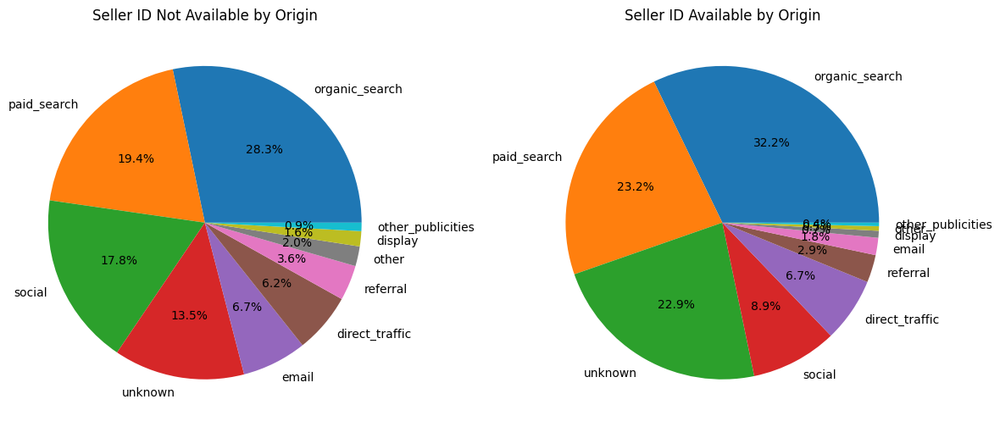

In [177]:
# Group by 'origin' and count the number of 'seller_id' that are 'Not Available'
seller_id_not_available_by_origin = df_mql_closed_fill.groupby('origin')['seller_id'].apply(lambda x: (x == 'Not Available').sum()).sort_values(ascending=False)

# Create a pie chart for seller_id 'Not Available'
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.pie(seller_id_not_available_by_origin, labels=seller_id_not_available_by_origin.index, autopct='%1.1f%%', startangle=0)
plt.title('Seller ID Not Available by Origin')

# Group by 'origin' and count the number of 'seller_id' that are NOT 'Not Available'
seller_id_available_by_origin = df_mql_closed_fill.groupby('origin')['seller_id'].apply(lambda x: (x != 'Not Available').sum()).sort_values(ascending=False)

# Create a pie chart for seller_id available
plt.subplot(1, 2, 2)
plt.pie(seller_id_available_by_origin, labels=seller_id_available_by_origin.index, autopct='%1.1f%%', startangle=0)
plt.title('Seller ID Available by Origin')

plt.tight_layout()
plt.show()


## Main Data Frame With Dropped Missing Values

In [178]:
# Drop rows with missing values in df_mql_closed
df_mql_closed.dropna(inplace=True)

# Verify if there are any more missing values
null_counts_mql_closed = df_mql_closed.isnull().sum()
print("Null Value Counts in df_mql_closed after dropping missing values:\n", null_counts_mql_closed)


Null Value Counts in df_mql_closed after dropping missing values:
 mql_id                           0
first_contact_date               0
landing_page_id                  0
origin                           0
seller_id                        0
sdr_id                           0
sr_id                            0
won_date                         0
business_segment                 0
lead_type                        0
lead_behaviour_profile           0
has_company                      0
average_stock                    0
business_type_org                0
declared_product_catalog_size    0
declared_monthly_revenue         0
lead_closure_time                0
is_deal_closed                   0
dtype: int64


In [179]:
df_mql_closed.dropna(inplace=True)
print(f"Shape of DataFrame after dropping null values: {df_mql_closed.shape}")


Shape of DataFrame after dropping null values: (842, 18)


In [180]:
# Descriptive statistics for lead_closure_time
print(df_mql_closed['lead_closure_time'].describe())


count    842.000000
mean      48.440618
std       75.328117
min       -2.000000
25%        5.000000
50%       14.000000
75%       54.750000
max      427.000000
Name: lead_closure_time, dtype: float64


In [181]:
# Display rows where 'lead_closure_time' is negative
negative_lead_closure = df_mql_closed[df_mql_closed['lead_closure_time'] < 0]
negative_lead_closure


,mql_id,first_contact_date,landing_page_id,origin,seller_id,sdr_id,sr_id,won_date,business_segment,lead_type,lead_behaviour_profile,has_company,average_stock,business_type_org,declared_product_catalog_size,declared_monthly_revenue,lead_closure_time,is_deal_closed
6357,b91cf8812365f50ff4bda4bcd6206b05,2018-03-08,4aab772aeb9833c170d8ea5413e02eac,organic_search,5e063e85d44b0f5c3e6ec3131103a57e,a8387c01a09e99ce014107505b92388c,495d4e95a8cf8bbf8b432b612a2aa328,2018-03-06 19:38:00,health_beauty,online_big,captain_america,True,above 100,reseller,300,"7,000",-2.0,True


Won date cannot be before first contacted date

In [182]:
# Drop rows with negative 'lead_closure_time'
df_mql_closed = df_mql_closed[df_mql_closed['lead_closure_time'] >= 0]

# Descriptive statistics for lead_closure_time
print(df_mql_closed['lead_closure_time'].describe())


count    841.000000
mean      48.500595
std       75.352823
min        0.000000
25%        5.000000
50%       14.000000
75%       55.000000
max      427.000000
Name: lead_closure_time, dtype: float64


In [183]:
df_mql_closed.head(20)

,mql_id,first_contact_date,landing_page_id,origin,seller_id,sdr_id,sr_id,won_date,business_segment,lead_type,lead_behaviour_profile,has_company,average_stock,business_type_org,declared_product_catalog_size,declared_monthly_revenue,lead_closure_time,is_deal_closed
4,5420aad7fec3549a85876ba1c529bd84,2018-02-21,b48ec5f3b04e9068441002a19df93c6c,organic_search,2c43fb513632d29b3b58df74816f1b06,a8387c01a09e99ce014107505b92388c,4ef15afb4b2723d8f3d81e51ec7afefe,2018-02-26 19:58:00,pet,online_medium,captain_america,False,above 100,reseller,400,"3,000",5.0,True
12,a555fb36b9368110ede0f043dfc3b9a0,2018-04-04,2f08471dfb83baef522f952438a36f6e,referral,bbb7d7893a450660432ea6652310ebb7,09285259593c61296eef10c734121d5b,d3d1e91a157ea7f90548eef82f1955e3,2018-05-08 20:17:00,car_accessories,industry,hawkeye,True,above 100,reseller,600,"6,000",34.0,True
14,327174d3648a2d047e8940d7d15204ca,2018-04-03,1ceb590cd1e00c7ee95220971f82693d,organic_search,612170e34b97004b3ba37eae81836b4c,b90f87164b5f8c2cfa5c8572834dbe3f,6565aa9ce3178a5caf6171827af3a9ba,2018-06-05 17:27:00,home_appliances,online_big,captain_america,False,above 100,reseller,700,"4,000",63.0,True
39,f5fee8f7da74f4887f5bcae2bafb6dd6,2018-01-14,22c29808c4f815213303f8933030604c,paid_search,21e1781e36faf92725dde4730a88ca0f,56bf83c4bb35763a51c2baab501b4c67,d3d1e91a157ea7f90548eef82f1955e3,2018-01-17 13:51:00,food_drink,online_small,scarlet_witch,True,above 100,reseller,700,"2,000",3.0,True
67,ffe640179b554e295c167a2f6be528e0,2017-10-09,a0fbc0263cb98bdb0d72b9f9f283a172,unknown,ed8cb7b190ceb6067227478e48cf8dde,4b339f9567d060bcea4f5136b9f5949e,d3d1e91a157ea7f90548eef82f1955e3,2018-07-03 20:17:00,home_appliances,industry,iron_man,False,below 100,manufacturer,300,"3,000",267.0,True
79,b94fba7670eeb44dce2a0d8eb790e9f5,2018-02-06,40dec9f3d5259a3d2dbcdab2114fae47,organic_search,1c742ac33582852aaf3bcfbf5893abcf,fdb16d3cbbeb5798f2f66c4096be026d,495d4e95a8cf8bbf8b432b612a2aa328,2018-02-07 18:04:00,health_beauty,online_medium,scarlet_witch,False,above 100,manufacturer,600,"1,000",1.0,True
82,c3e30ed7ac989117c7e1e719b4ac128f,2018-02-20,e492ee5eaf1697716985cc6f33f9cd9b,direct_traffic,92d7568ad0c5c76fd7d341b2d46f24d6,4b339f9567d060bcea4f5136b9f5949e,85fc447d336637ba1df43e793199fbc8,2018-04-16 18:18:00,computers,online_medium,iron_man,True,above 100,reseller,700,"4,000",55.0,True
86,b02c89251106e1fdd9d92744be9f94f2,2018-04-13,b76ef37428e6799c421989521c0e5077,unknown,44ed138eca6214d572ce1d813fb0049b,34d40cdaf94010a1d05b0d6212f9e909,4ef15afb4b2723d8f3d81e51ec7afefe,2018-04-17 17:01:00,health_beauty,offline,captain_america,False,above 100,manufacturer,900,"4,000",4.0,True
98,a90a37898cc5f2718385a2fb981caaff,2018-04-27,58326e62183c14b0c03085c33b9fdc44,social,0b28859cd04d23edefee9c591fb03cd8,f42a2bd194f7802ab052a815c8de65b7,6565aa9ce3178a5caf6171827af3a9ba,2018-05-14 18:37:00,household_utilities,offline,hawkeye,False,above 100,reseller,500,"5,000",17.0,True
110,0173e8d8b1d94a355b440fb67388f532,2017-10-18,007f9098284a86ee80ddeb25d53e0af8,paid_search,87d73636a3acf123e842bb890a4db036,9d12ef1a7eca3ec58c545c678af7869c,9e4d1098a3b0f5da39b0bc48f9876645,2018-04-24 03:00:00,household_utilities,online_medium,hawkeye,False,above 100,manufacturer,400,"7,000",188.0,True


### Check if all landing pages are unique in df_mql_closed

In [184]:
unique_landing_pages = df_mql_closed['landing_page_id'].nunique()
total_landing_pages = len(df_mql_closed)

if unique_landing_pages == total_landing_pages:
    print("All landing pages are unique in df_mql_closed.")
else:
    print("Not all landing pages are unique in df_mql_closed.")


Not all landing pages are unique in df_mql_closed.


In [185]:
# Check the frequency of each landing page ID
landing_page_counts = df_mql_closed['landing_page_id'].value_counts()

# Find landing page IDs that are repeated more than once
repeated_landing_pages = landing_page_counts[landing_page_counts > 1]

# Check how many times each landing page ID is repeated
print("\nLanding Page ID Repetition Counts:")
for landing_page_id, count in repeated_landing_pages.items():
  print(f"Landing Page ID: {landing_page_id}, Repeated: {count} times")



Landing Page ID Repetition Counts:
Landing Page ID: 22c29808c4f815213303f8933030604c, Repeated: 174 times
Landing Page ID: b76ef37428e6799c421989521c0e5077, Repeated: 171 times
Landing Page ID: 40dec9f3d5259a3d2dbcdab2114fae47, Repeated: 67 times
Landing Page ID: ce1a65abd0973638f1c887a6efcfa82d, Repeated: 59 times
Landing Page ID: 88740e65d5d6b056e0cda098e1ea6313, Repeated: 31 times
Landing Page ID: 58326e62183c14b0c03085c33b9fdc44, Repeated: 27 times
Landing Page ID: f017be4dbf86243af5c1ebed0cff36a2, Repeated: 21 times
Landing Page ID: a7982125ff7aa3b2054c6e44f9d28522, Repeated: 18 times
Landing Page ID: 241f79c7a8fe0270f4fb79fcbbcd17ad, Repeated: 14 times
Landing Page ID: 7fa6214d82e911d070f51ef79381b956, Repeated: 11 times
Landing Page ID: 30077c17f2ec5010a82e37ad8925b95f, Repeated: 10 times
Landing Page ID: e492ee5eaf1697716985cc6f33f9cd9b, Repeated: 10 times
Landing Page ID: 1ceb590cd1e00c7ee95220971f82693d, Repeated: 9 times
Landing Page ID: 35c9b150ab36fe584c1f24fd458c453a, Re

In [186]:
# Convert to csv
df_mql_closed.to_csv('df_mql_closed.csv', sep=',', index=False)

In [187]:
# Convert to csv
df_master = df_master.groupby('order_id').agg({
    # Identifiers
    'customer_id': 'first',
    'order_status': 'first',

    # Dates (pick earliest or representative values)
    'order_purchase_timestamp': 'first',
    'order_approved_at': 'first',
    'order_delivered_carrier_date': 'first',
    'order_delivered_customer_date': 'first',
    'order_estimated_delivery_date': 'first',
    'shipping_limit_date': 'first',
    'review_creation_date': 'first',
    'review_answer_timestamp': 'first',

    # Product and seller info
    'order_item_id': 'min',
    'seller_id': 'first',
    'product_id': 'first',
    'product_category_name_english': 'first',
    'product_weight_g': 'first',
    'product_length_cm': 'first',
    'product_height_cm': 'first',
    'product_width_cm': 'first',

    # Prices and payments
    'price': 'first',
    'freight_value': 'first',
    'payment_value': 'sum',
    'payment_sequential': 'max',
    'payment_type': 'first',
    'payment_installments': 'max',

    # Review-related
    'review_id': 'first',
    'review_score': 'first',
    'review_comment_title': 'first',
    'review_comment_message': 'first',

    # Customer info
    'customer_unique_id': 'first',
    'customer_zip_code_prefix': 'first',
    'customer_city': 'first',
    'customer_state': 'first',

    # Seller info
    'seller_zip_code_prefix': 'first',
    'seller_city': 'first',
    'seller_state': 'first',

    # Delivery time
    'delivery_time_days': 'first'  # or 'mean' if aggregated across splits
}).reset_index()

df_master.to_csv('master_file.csv', sep=',', index=False)

## Explore Data (Due Dilligence)

In [188]:
# Use profiling function to get overall picture of the dataset
!pip install ydata-profiling
from pandas_profiling import ProfileReport

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 45.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 52.5 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=d03210315128d23cdb025a631ae659322c83cdfc3c87344a9a7995db74b74d16
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


<ipython-input-188-6171d6f272ad>:3: DeprecationWarning:

`import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.



In [189]:
# Use pandas profiling
profile = ProfileReport(df_master, title="Master Data Overall Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 37/37 [00:19<00:00,  1.85it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [190]:
df_master.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 37 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       99441 non-null  object        
 1   customer_id                    99441 non-null  object        
 2   order_status                   99441 non-null  object        
 3   order_purchase_timestamp       99441 non-null  datetime64[ns]
 4   order_approved_at              99441 non-null  object        
 5   order_delivered_carrier_date   99441 non-null  object        
 6   order_delivered_customer_date  99441 non-null  object        
 7   order_estimated_delivery_date  99441 non-null  datetime64[ns]
 8   shipping_limit_date            99441 non-null  object        
 9   review_creation_date           99441 non-null  datetime64[ns]
 10  review_answer_timestamp        99441 non-null  datetime64[ns]
 11  order_item_id  

In [191]:
print(df_master.head(10).to_string())

                           order_id                       customer_id order_status order_purchase_timestamp    order_approved_at order_delivered_carrier_date order_delivered_customer_date order_estimated_delivery_date  shipping_limit_date review_creation_date review_answer_timestamp order_item_id                         seller_id                        product_id product_category_name_english product_weight_g product_length_cm product_height_cm product_width_cm   price  freight_value  payment_value payment_sequential payment_type  payment_installments                         review_id  review_score review_comment_title                                                                                                                                                           review_comment_message                customer_unique_id customer_zip_code_prefix    customer_city     customer_state seller_zip_code_prefix      seller_city  seller_state delivery_time_days
0  00010242fe8c5a6d1ba2dd792

In [192]:
# Check if there are more than 1 different product IDs in the same order ID
order_product_counts = df_master.groupby('order_id')['product_id'].nunique()
orders_with_multiple_products = order_product_counts[order_product_counts > 1]

print("Number of orders with more than one different product ID:", len(orders_with_multiple_products))

Number of orders with more than one different product ID: 0


MQL Closed Data

In [193]:
profile2 = ProfileReport(df_mql_closed, title="Pandas Profiling Report")
profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 18/18 [00:00<00:00, 73.49it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [194]:
null_counts = df_mql_closed.isnull().sum()
print("Null Value Counts is:\n", null_counts)
print(f"Dhape of DataFrame is: {df_mql_closed.shape}")

Null Value Counts is:
 mql_id                           0
first_contact_date               0
landing_page_id                  0
origin                           0
seller_id                        0
sdr_id                           0
sr_id                            0
won_date                         0
business_segment                 0
lead_type                        0
lead_behaviour_profile           0
has_company                      0
average_stock                    0
business_type_org                0
declared_product_catalog_size    0
declared_monthly_revenue         0
lead_closure_time                0
is_deal_closed                   0
dtype: int64
Dhape of DataFrame is: (841, 18)


In [195]:
print(df_mql_closed.head(10).to_string())

                               mql_id first_contact_date                   landing_page_id          origin                         seller_id                            sdr_id                             sr_id            won_date     business_segment      lead_type lead_behaviour_profile has_company average_stock business_type_org declared_product_catalog_size declared_monthly_revenue  lead_closure_time  is_deal_closed
4    5420aad7fec3549a85876ba1c529bd84         2018-02-21  b48ec5f3b04e9068441002a19df93c6c  organic_search  2c43fb513632d29b3b58df74816f1b06  a8387c01a09e99ce014107505b92388c  4ef15afb4b2723d8f3d81e51ec7afefe 2018-02-26 19:58:00                  pet  online_medium        captain_america       False     above 100          reseller                           400                    3,000                5.0            True
12   a555fb36b9368110ede0f043dfc3b9a0         2018-04-04  2f08471dfb83baef522f952438a36f6e        referral  bbb7d7893a450660432ea6652310ebb7  09285259593c61

### Redundant Check (Data Cleaning and Wrangling)


Master Data

In [ ]:
# Check Duplicated rows
duplicate_rows = df_master.duplicated().sum()
print("\nNumber of Duplicate Rows:", duplicate_rows)


Number of Duplicate Rows: 0


In [ ]:
# Check for null values only
null_counts = df_master.isnull().sum()
print("Null Value Counts:\n", null_counts)
df_master.shape

Null Value Counts:
 order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
order_item_id                    0
product_id                       0
seller_id                        0
shipping_limit_date              0
price                            0
freight_value                    0
payment_sequential               0
payment_type                     0
payment_installments             0
payment_value                    0
review_id                        0
review_score                     0
review_comment_title             0
review_comment_message           0
review_creation_date             0
review_answer_timestamp          0
product_weight_g                 0
product_length_cm                0
product_height_cm                0
product_width_cm                 0


(118227, 37)

### Mql Closed Data

In [ ]:
# Check Duplicated rows
duplicate_rows = df_mql_closed.duplicated().sum()
print("\nNumber of Duplicate Rows:", duplicate_rows)


Number of Duplicate Rows: 0


In [ ]:
# Check for null values only
null_counts = df_mql_closed.isnull().sum()
print("Null Value Counts:\n", null_counts)
df_master.shape

Null Value Counts:
 mql_id                           0
first_contact_date               0
landing_page_id                  0
origin                           0
seller_id                        0
sdr_id                           0
sr_id                            0
won_date                         0
business_segment                 0
lead_type                        0
lead_behaviour_profile           0
has_company                      0
average_stock                    0
business_type_org                0
declared_product_catalog_size    0
declared_monthly_revenue         0
lead_closure_time                0
is_deal_closed                   0
dtype: int64


(118227, 37)

## **Main Exploratory Data Analysis**

In [196]:
df_master = pd.read_csv('/content/master_file.csv')
df_mql_closed = pd.read_csv('/content/df_mql_closed.csv')

<ipython-input-196-77c818e0e3ea>:1: DtypeWarning:

Columns (22) have mixed types. Specify dtype option on import or set low_memory=False.



Different Kind of Order Status

In [207]:
print(df_master.head().to_string())

                           order_id                       customer_id order_status order_purchase_timestamp    order_approved_at order_delivered_carrier_date order_delivered_customer_date order_estimated_delivery_date  shipping_limit_date review_creation_date review_answer_timestamp order_item_id                         seller_id                        product_id product_category_name_english product_weight_g product_length_cm product_height_cm product_width_cm   price  freight_value  payment_value payment_sequential payment_type  payment_installments                         review_id  review_score review_comment_title                                                                       review_comment_message                customer_unique_id customer_zip_code_prefix  customer_city customer_state seller_zip_code_prefix   seller_city seller_state delivery_time_days
0  00010242fe8c5a6d1ba2dd792cb16214  3ce436f183e68e07877b285a838db11a    delivered      2017-09-13 08:59:00  2017-09-13 09

In [215]:
df_master.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 37 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   order_id                       99441 non-null  object 
 1   customer_id                    99441 non-null  object 
 2   order_status                   99441 non-null  object 
 3   order_purchase_timestamp       99441 non-null  object 
 4   order_approved_at              99441 non-null  object 
 5   order_delivered_carrier_date   99441 non-null  object 
 6   order_delivered_customer_date  99441 non-null  object 
 7   order_estimated_delivery_date  99441 non-null  object 
 8   shipping_limit_date            99441 non-null  object 
 9   review_creation_date           99441 non-null  object 
 10  review_answer_timestamp        99441 non-null  object 
 11  order_item_id                  99441 non-null  object 
 12  seller_id                      99441 non-null 

In [197]:
unique_order_statuses = df_master['order_status'].unique()
print(unique_order_statuses)

['delivered' 'unavailable' 'shipped' 'canceled' 'invoiced' 'processing'
 'approved' 'created']


In [198]:
# Count the number of each order status, considering only one count per order_id
order_status_counts = df_master.groupby('order_id')['order_status'].first().value_counts()
order_status_counts


,count
order_status,
delivered,96478
shipped,1107
canceled,625
unavailable,609
invoiced,314
processing,301
created,5
approved,2


In [199]:
not_available_reviews = df_master[df_master['review_comment_message'] == 'Not Available']
print(not_available_reviews.head(50).to_string())


                            order_id                       customer_id order_status order_purchase_timestamp    order_approved_at order_delivered_carrier_date order_delivered_customer_date order_estimated_delivery_date  shipping_limit_date review_creation_date review_answer_timestamp order_item_id                         seller_id                        product_id   product_category_name_english product_weight_g product_length_cm product_height_cm product_width_cm   price  freight_value  payment_value payment_sequential payment_type  payment_installments                         review_id  review_score review_comment_title review_comment_message                customer_unique_id customer_zip_code_prefix           customer_city       customer_state seller_zip_code_prefix               seller_city       seller_state delivery_time_days
1   00018f77f2f0320c557190d7a144bdd3  f6dd3ec061db4e3987629fe6b26e5cce    delivered      2017-04-26 10:53:00  2017-04-26 11:05:00          2017-05-04 14:35:

### Payment Sequential

In [125]:
payments_per_order = df_master.groupby('order_id')['payment_sequential'].count()
print(payments_per_order.value_counts().sort_index())

payment_sequential
1    99441
Name: count, dtype: int64


### Payment Value by Customer for Each Payment Type

In [208]:
import plotly.express as px

# Group by 'payment_type' and sum the 'payment_value'
payment_value_by_type = (
    df_master.groupby('payment_type')['payment_value']
    .sum()
    .sort_values(ascending=False)
    .reset_index()
)

# Pie chart to visualize the percentage distribution of payment values
pie_fig = px.pie(
    payment_value_by_type,
    names='payment_type',
    values='payment_value',
    title='Payment Value Percentage Distribution by Payment Type'
)
pie_fig.show()

# percentage for each payment type
Total_payments= df_master.groupby('payment_type')['payment_value'].sum()
payment_type_percentage = (Total_payments / Total_payments.sum()) * 100


### Distribution of Payment Counts

Payment Count by Customer for Each Payment Type

In [128]:
# Group by 'payment_type' and count the number of payments
payment_count_by_type = (
    df_master.groupby('payment_type')['payment_type']
    .count()
    .sort_values(ascending=False)
    .reset_index(name='payment_count')
)

pie_fig = px.pie(
    payment_count_by_type,
    names='payment_type',
    values='payment_count',
    title='Payment Count Percentage Distribution by Payment Type'
)
pie_fig.show()

bar_fig = px.bar(
    payment_count_by_type,
    x='payment_type',
    y='payment_count',
    text='payment_count',
    labels={'payment_type': 'Payment Type', 'payment_count': 'Payment Count'},
    title='Payment Count by Payment Type'
)

bar_fig.update_traces(texttemplate='%{text}', textposition='outside')
bar_fig.show()

### Purchase Count Time Series

In [209]:
df_delivered = df_master[df_master['order_status'] == 'delivered'].copy()

In [211]:
# Count the number of delivered order for each month, considering only one count per order_id.
df_delivered['order_purchase_timestamp'] = pd.to_datetime(df_delivered['order_purchase_timestamp'])

df_delivered['purchase_month'] = df_delivered['order_purchase_timestamp'].dt.to_period('M').dt.to_timestamp()
monthly_purchase_counts = df_delivered.groupby('purchase_month')['order_id'].nunique().reset_index(name='count')

# Plot line chart
line_fig = px.line(
    monthly_purchase_counts,
    x='purchase_month',
    y='count',
    title='Delivered Purchase Count Each Month',
    markers=True
)

# Annotate counts on the chart
line_fig.update_traces(mode='lines+markers+text', text=monthly_purchase_counts['count'], textposition='top center')

# Set x-axis to show monthly ticks
line_fig.update_layout(
    xaxis_title='Month',
    yaxis_title='Number of Delivered Orders',
    xaxis=dict(
        tickformat='%b %Y',
        dtick="M1"
    )
)
line_fig.show()

### Year-over-Year Purchase Count

In [212]:
# Count the number of delivered order for each year, considering only one count per order_id.
df_delivered['purchase_year'] = df_delivered['order_purchase_timestamp'].dt.year
purchase_counts = df_delivered['purchase_year'].value_counts().sort_index().reset_index()
purchase_counts = df_delivered.groupby('purchase_year')['order_id'].nunique().reset_index(name='count')

purchase_counts['purchase_year'] = purchase_counts['purchase_year'].astype(str)

# Plot line chart
line_fig = px.line(
    purchase_counts,
    x='purchase_year',
    y='count',
    title='Delivered Purchase Count Each Year',
    markers=True
)

# Annotate counts on the chart
line_fig.update_traces(mode='lines+markers+text', text=purchase_counts['count'], textposition='top center')
line_fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Number of Delivered Orders',
)
line_fig.show()


Delivery Time Distribution

In [219]:
import plotly.graph_objects as go
# Remove duplicate delivery time records, keeping only the first one for each order ID
df_master = df_master.groupby('order_id').first().reset_index().copy()

data = pd.to_numeric(df_master['delivery_time_days'], errors='coerce')
hist_trace = go.Histogram(
    x=data,
    nbinsx=50,
    name='Histogram',
    opacity=0.75
)
xmin, xmax = data.min(), data.max()
x_range = np.linspace(xmin, xmax, 1000)
bin_width = x_range[1] - x_range[0]
fig = go.Figure(data=[hist_trace])
fig.update_layout(
    title='Delivery Time Distribution',
    xaxis_title='Delivery Time (Days)',
    yaxis_title='Frequency',
    bargap=0.2
)
fig.show()


Distribution of Origin from MQL Closed Deals


In [ ]:
origin_counts = df_mql_closed['origin'].value_counts().reset_index()
origin_counts.columns = ['origin', 'count']

fig = px.bar(
    origin_counts,
    x='origin',
    y='count',
    text='count',
    color='origin',
    labels={'origin': 'Origin', 'count': 'Number of Closed MQLs'},
    title='Distribution of Origin from MQL Closed Deals'
)

fig.update_traces(texttemplate='%{text}', textposition='outside')

fig.show()

Number of Leads Per L.Type and Origin

In [ ]:
lead_type_origin_counts = df_mql_closed.groupby(['lead_type', 'origin']).size().reset_index(name='count')

fig = px.bar(
    lead_type_origin_counts,
    x='lead_type',
    y='count',
    color='origin',
    barmode='group',
    labels={'lead_type': 'Lead Type', 'count': 'Number of Leads', 'origin': 'Origin'},
    title='Number of Leads per Lead Type and Origin'
)
fig.show()


Business Type Counts

In [ ]:
business_type_counts = df_mql_closed['business_type_org'].value_counts()
business_type_counts


,count
business_type_org,
reseller,586
manufacturer,242
other,13


In [ ]:
business_type_origin_counts = df_mql_closed.groupby(['business_type_org', 'origin']).size().reset_index(name='count')

fig = px.bar(
    business_type_origin_counts,
    x='business_type_org',
    y='count',
    color='origin',
    barmode='group',
    labels={'business_type_org': 'Business Type', 'count': 'Number of Closed MQLs', 'origin': 'Origin'},
    title='Number of Closed MQLs per Business Type and Origin'
)
fig.show()


# CMO Challenge

### Best Performing Product Category Analysis


Create Selected Dataset fro CMO Challenge

In [213]:
df_delivered = df_master[df_master['order_status'] == 'delivered'].copy()
df_delivered_prod = df_delivered.groupby('order_id').agg({
    'price': 'first',
    'freight_value': 'first',
    'payment_value': 'sum',
    'product_id': 'first',
    'product_category_name_english': 'first',
    'order_status': 'first',
    'order_purchase_timestamp': 'first',
    'order_approved_at': 'first',
    'order_delivered_carrier_date': 'first',
    'order_delivered_customer_date': 'first',
    'order_estimated_delivery_date': 'first',
    'shipping_limit_date': 'first',
    'payment_type': 'first',
    'payment_installments': 'max',
    'review_score': 'first',
    'review_comment_message': 'first'
}).reset_index()

In [201]:
print(df_delivered_prod.head(10).to_string())

                           order_id   price  freight_value  payment_value                        product_id product_category_name_english order_status order_purchase_timestamp    order_approved_at order_delivered_carrier_date order_delivered_customer_date order_estimated_delivery_date  shipping_limit_date payment_type  payment_installments  review_score                                                                                                                                                           review_comment_message
0  00010242fe8c5a6d1ba2dd792cb16214   58.90          13.29          72.19  4244733e06e7ecb4970a6e2683c13e61                    cool_stuff    delivered      2017-09-13 08:59:00  2017-09-13 09:45:00          2017-09-19 18:34:00           2017-09-20 23:43:00                    2017-09-29  2017-09-19 09:45:00  credit_card                   2.0             5                                                                                                                

In [202]:
# Filter only delivered orders
category_perf = df_delivered_prod.groupby('product_category_name_english', as_index=False).agg({
    'payment_value':'sum',
    'order_id':'count'
})
category_perf.rename(columns={
    'payment_value':'total_sales',
    'order_id':'items_sold'
}, inplace=True)

category_perf.sort_values('total_sales', ascending=False, inplace=True)

print("Top 10 categories by absolute revenue:")
print(category_perf.head(10).to_string())

Top 10 categories by absolute revenue:
   product_category_name_english  total_sales  items_sold
8                 bed_bath_table   1725330.98        9167
44                 health_beauty   1623434.58        8608
15         computers_accessories   1552149.93        6501
40               furniture_decor   1415751.41        6213
71                 watches_gifts   1386032.51        5472
65                sports_leisure   1360010.37        7491
50                    housewares   1077219.38        5688
6                           auto    835437.05        3793
43                  garden_tools    804386.16        3414
22                    cool_stuff    748165.42        3530


## Monthly Growth Sales

In [220]:
# Extract month (datetime type)
df_delivered_prod['order_purchase_timestamp'] = pd.to_datetime(df_delivered_prod['order_purchase_timestamp'])
df_delivered_prod['purchase_month'] = df_delivered_prod['order_purchase_timestamp'].dt.to_period('M').dt.to_timestamp()

# Group by month and product category, then sum sales
monthly_sales = df_delivered_prod.groupby(['purchase_month', 'product_category_name_english'])['price'].sum().reset_index()
monthly_sales.rename(columns={'price': 'month_sales'}, inplace=True)

# Extract unique months (sorted)
months = sorted(monthly_sales['purchase_month'].unique())

# Build top 10 categories per month
top_categories_by_month = {}
for month in months:
    month_data = monthly_sales[monthly_sales['purchase_month'] == month]
    top10 = month_data.sort_values('month_sales', ascending=False).head(10)
    top_categories_by_month[month] = {cat: rank+1 for rank, cat in enumerate(top10['product_category_name_english'])}

# Full ranking for all categories per month
all_rank_by_month = {}
sales_by_month = {}

for month in months:
    month_data = monthly_sales[monthly_sales['purchase_month'] == month]
    sorted_sales = month_data.sort_values('month_sales', ascending=False)
    rank_mapping = {row.product_category_name_english: rank for rank, row in enumerate(sorted_sales.itertuples(index=False), start=1)}
    all_rank_by_month[month] = rank_mapping
    sales_by_month[month] = dict(zip(month_data['product_category_name_english'], month_data['month_sales']))

# All categories ever in top 10
all_top_categories = set()
for mapping in top_categories_by_month.values():
    all_top_categories.update(mapping.keys())

# Prepare rank data
rank_data = {}
for category in all_top_categories:
    ranks = []
    for month in months:
        rank = top_categories_by_month[month].get(category, None)
        ranks.append(rank)
    rank_data[category] = ranks

# Plot using Plotly
fig = go.Figure()

for category, ranks in rank_data.items():
    hover_texts = []
    for i, month in enumerate(months):
        actual_rank = all_rank_by_month[month].get(category, "N/A")
        if i == 0:
            text_line = f"Product: {category}<br>Rank: {actual_rank}"
        else:
            prev_month = months[i - 1]
            prev_rank = all_rank_by_month[prev_month].get(category, "N/A")

            if (category in sales_by_month.get(prev_month, {})) and (category in sales_by_month.get(month, {})):
                prev_sales = sales_by_month[prev_month][category]
                curr_sales = sales_by_month[month][category]
                growth = (curr_sales - prev_sales) / (prev_sales if prev_sales != 0 else 1) * 100
                growth_text = f"{growth:.2f}%"
            else:
                growth_text = "N/A"

            text_line = (f"Product: {category}<br>"
                         f"Rank: {actual_rank}<br>"
                         f"Growth: {growth_text}<br>"
                         f"Previous Rank: {prev_rank}")
        hover_texts.append(text_line)

    fig.add_trace(go.Scatter(
        x=months,
        y=ranks,
        mode='lines+markers',
        name=category,
        hovertext=hover_texts,
        hoverinfo='text'
    ))

# Layout settings
fig.update_layout(
    title='Top 10 Product Categories by Month (Rank Movement & MoM Growth)',
    xaxis=dict(
        title='Month',
        tickmode='array',
        tickvals=months,
        tickformat='%b %Y'
    ),
    yaxis=dict(
        title='Rank',
        autorange='reversed',
        dtick=1,
        range=[10.5, 0.5]
    ),
    height=600
)

fig.show()


In [221]:
# Prepare a dataframe of ranks per category per month
rank_df = pd.DataFrame.from_dict(rank_data, orient='index', columns=months).T
rank_df.index = pd.to_datetime(rank_df.index)
rank_df = rank_df.sort_index()

# Compute metrics per category
category_scores = []

for category in rank_data.keys():
    ranks = pd.Series(rank_data[category], index=months)
    # Remove NaNs (not in top 10 that month)
    valid_ranks = ranks.dropna()

    if len(valid_ranks) < 4:
        continue  # Skip categories with insufficient data

    # Average Rank (lower is better)
    avg_rank = valid_ranks.mean()

    # Rank trend (negative slope = improving)
    rank_diff = valid_ranks.diff().dropna()
    avg_rank_change = rank_diff.mean()

    # Appearances in Top 10
    top_10_count = valid_ranks.count()

    # MoM growth
    growths = []
    for i in range(1, len(months)):
        prev_month = months[i - 1]
        curr_month = months[i]
        if (category in sales_by_month.get(prev_month, {})) and (category in sales_by_month.get(curr_month, {})):
            prev = sales_by_month[prev_month][category]
            curr = sales_by_month[curr_month][category]
            if prev > 0:
                growth = (curr - prev) / prev * 100
                growths.append(growth)

    if len(growths) == 0:
        continue

    avg_growth = sum(growths) / len(growths)

    # Last 3-month sales acceleration
    recent_months = months[-3:]
    recent_sales = [sales_by_month[m].get(category, 0) for m in recent_months]
    acceleration = (recent_sales[-1] - recent_sales[0]) / (recent_sales[0] if recent_sales[0] else 1) * 100

    # Final Score: weighted index (custom weights)
    score = (
        -avg_rank * 0.4 +           # Better rank → higher score
        -avg_rank_change * 0.2 +    # Improving ranks (negative change) → higher score
        avg_growth * 0.3 +          # More sales growth
        acceleration * 0.1          # Recent momentum
    )

    category_scores.append({
        'Product Category': category,
        'Average Rank': avg_rank,
        'Average Change in Rank ': avg_rank_change,
        'Top 10 Position Count': top_10_count,
        'Average Growth (%)': avg_growth,
        'Sales Growth (%)(Last 3 Months)': acceleration,
        'Growth Score': score
    })

# Sort by final score
score_df = pd.DataFrame(category_scores)
score_df = score_df.sort_values(by='Growth Score', ascending=False)

In [222]:
score_df

,Product Category,Average Rank,Average Change in Rank,Top 10 Position Count,Average Growth (%),Sales Growth (%)(Last 3 Months),Growth Score
11,health_beauty,2.318182,0.000000,22,368.116256,12.249277,110.732532
9,housewares,7.166667,-0.454545,12,31.333844,8.476945,7.472090
0,computers_accessories,5.736842,-0.111111,19,27.601847,-0.357041,5.972335
4,bed_bath_table,3.789474,0.000000,19,27.099777,-15.244789,5.089665
7,sports_leisure,3.904762,-0.100000,21,13.749652,21.786927,4.761684
10,auto,6.916667,0.000000,12,21.175473,0.963892,3.682364
3,watches_gifts,3.047619,-0.200000,21,17.388885,-17.812778,2.256340
1,furniture_decor,6.950000,0.368421,20,13.120022,-1.508331,0.931489
8,perfumery,8.000000,1.000000,9,15.170884,-8.454040,0.305861
12,toys,6.800000,0.111111,10,16.358597,-21.122910,0.053066


### Market Share of Product Categories

In [223]:
df = df_delivered_prod.copy()

# 1: Market share by total revenue (using payment_value)
category_revenue = df.groupby('product_category_name_english')['payment_value'].sum().reset_index()
category_revenue.columns = ['Category', 'TotalRevenue']
category_revenue['MarketShare_Revenue%'] = 100 * category_revenue['TotalRevenue'] / category_revenue['TotalRevenue'].sum()

# 2: Market share by unique orders
category_orders = df.groupby('product_category_name_english')['order_id'].nunique().reset_index()
category_orders.columns = ['Category', 'UniqueOrders']
category_orders['MarketShare_Order%'] = 100 * category_orders['UniqueOrders'] / category_orders['UniqueOrders'].sum()


In [224]:
# 1. Market share by total revenue (using payment_value)
top_categories = category_revenue.sort_values(by='MarketShare_Revenue%', ascending=False).head(10)

fig = px.bar(
    top_categories,
    x='Category',
    y='MarketShare_Revenue%',
    title='Top 10 Product Categories by Market Share (Revenue)',
    text='MarketShare_Revenue%',
    color='Category'
)
fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside')
fig.update_layout(xaxis_title='Category', yaxis_title='Market Share (%)')
fig.show()


# 2. Market share by unique orders
top_categories = category_orders.sort_values(by='MarketShare_Order%', ascending=False).head(10)

fig = px.bar(
    top_categories,
    x='Category',
    y='MarketShare_Order%',
    title='Top 10 Product Categories by Market Share (Order)',
    text='MarketShare_Order%',
    color='Category'
)
fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside')
fig.update_layout(xaxis_title='Category', yaxis_title='Market Share (%)')
fig.show()

### Potential Product Categories (Low Sales, High Growth)

Check Skewness of 'Averga Rank' and 'Average Growth'

In [225]:
from scipy.stats import skew
# Check skewness of 'Average Rank'
skewness_avg_rank = skew(score_df['Average Rank'])
print(f"Skewness of Average Rank: {skewness_avg_rank}")

# Check skewness of 'Average Growth'
skewness_avg_growth = skew(score_df['Average Growth (%)'])
print(f"Skewness of Average Growth: {skewness_avg_growth}")

# Interpretation:
# If the skewness is close to 0, it indicates a relatively symmetrical distribution.
# If the skewness is positive, it indicates a right-skewed distribution (tail to the right).
# If the skewness is negative, it indicates a left-skewed distribution (tail to the left).


Skewness of Average Rank: -0.31327370269959687
Skewness of Average Growth: 3.1493876579029285


In [ ]:
# Find categories with low current sales but high growth rate
low_sales_high_growth = score_df[
    (score_df['Average Rank'] > score_df['Average Rank'].median()) &  # Categories with lower than median rank (higher rank)
    (score_df['Average Growth (%)'] > score_df['Average Growth (%)'].median())
]

print("Categories with low current sales but high growth rate:")
print(low_sales_high_growth[['Product Category', 'Average Rank', 'Average Growth (%)', 'Growth Score']].to_string())


Categories with low current sales but high growth rate:
   Product Category  Aevrage Rank  Average Growth (%)  Growth Score
5        housewares      7.166667           30.199068      6.990089
10             auto      7.285714           21.018859      3.840670


Marketing Strategy Insights:
1. Enhance content feed to customer on the high sales product by also keeping the consideration to emerging item trend.

2. For categories with high YoY growth but smaller base, run targeted campaigns to accelerate adoption.



### RFM MQL (Seller) Analysis


In [232]:
# prompt: plese do the rfm analysis with unsupervised learning

import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Assuming you have a dataframe called 'df_mql_closed' with relevant columns like:
# 'seller_id', 'first_contact_date', 'last_contact_date', 'total_leads'

# Calculate Recency, Frequency, and Monetary Value for each seller
# Last contact date as a reference for recency
latest_date = df_mql_closed['first_contact_date'].max()

rfm_df = df_mql_closed.groupby('seller_id').agg({
    'first_contact_date': lambda x: (latest_date - x.max()).days,  # Recency (days since last contact)
    'seller_id': 'count',                                      # Frequency (total number of contacts/leads)
    'total_leads': 'sum'                                       # Monetary (total number of leads generated)
})

rfm_df.rename(columns={
    'first_contact_date': 'Recency',
    'seller_id': 'Frequency',
    'total_leads': 'MonetaryValue'
}, inplace=True)

# Standardize the RFM data
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_df)

n_clusters = 3

# Perform K-Means clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(rfm_scaled)

# Assign cluster labels to the RFM dataframe
rfm_df['Cluster'] = kmeans.labels_

# Analyze the clusters
cluster_analysis = rfm_df.groupby('Cluster').agg({
    'Recency': 'mean',
    'Frequency': 'mean',
    'MonetaryValue': 'mean'
})

cluster_analysis

# Visualize the clusters (you can use scatter plots or other methods)
# Example:
# sns.scatterplot(x='Recency', y='Frequency', hue='Cluster', data=rfm_df)
# plt.show()

# You can now interpret the clusters based on their RFM characteristics
# For instance:
# - Cluster 0: High-Value Customers (low recency, high frequency, high monetary value)
# - Cluster 1: At-Risk Customers (high recency, medium frequency, medium monetary value)
# - Cluster 2: Loyal Customers (low recency, high frequency, low monetary value)
# - Cluster 3: New Customers (low recency, low frequency, low monetary value)

# Use these insights to tailor marketing strategies for each cluster.


KeyError: "Column(s) ['total_leads'] do not exist"

In [236]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score


def prepare_mql_data_rfm(df):
    df = df.copy()
    df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'], format="%d/%m/%Y %H:%M", errors='coerce')

    # Reference date for recency
    ref_date = df['order_purchase_timestamp'].max()

    rfm = (
        df.groupby('customer_id').agg({
            'order_purchase_timestamp': lambda x: (ref_date - x.max()).days,
            'order_id': 'count',
            'payment_value': 'sum'
        })
        .rename(columns={
            'order_purchase_timestamp': 'Recency',
            'order_id': 'Frequency',
            'payment_value': 'Monetary'
        })
        .reset_index()
    )
    rfm.dropna(inplace=True)

    return rfm

df_rfm = prepare_mql_data_rfm(df_delivered)


def evaluate_kmeans_elbow_silhouette(df_rfm, k_range=range(2, 8)):
    features = ['Recency', 'Frequency', 'Monetary']
    scaler = StandardScaler()
    rfm_scaled = scaler.fit_transform(df_rfm[features])

    sse = []
    sil_scores = []

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=2025)
        kmeans.fit(rfm_scaled)
        sse.append(kmeans.inertia_)
        sil_scores.append(silhouette_score(rfm_scaled, kmeans.labels_))
        print(f"k={k} | SSE={sse[-1]:.2f} | Silhouette={sil_scores[-1]:.4f}")

    return sse, sil_scores

k_range = range(2, 8)
sse_vals, sil_vals = evaluate_kmeans_elbow_silhouette(df_rfm, k_range)

k=2 | SSE=125047.29 | Silhouette=0.5198
k=3 | SSE=109170.70 | Silhouette=0.4641
k=4 | SSE=72488.93 | Silhouette=0.4645
k=5 | SSE=50358.09 | Silhouette=0.4775
k=6 | SSE=38566.12 | Silhouette=0.4880
k=7 | SSE=33704.05 | Silhouette=0.4400


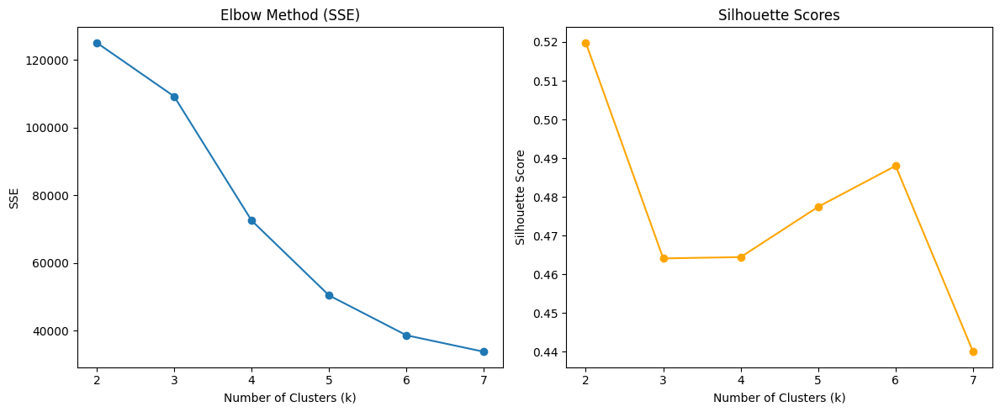

In [237]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Elbow plot
axs[0].plot(k_range, sse_vals, marker='o')
axs[0].set_title('Elbow Method (SSE)')
axs[0].set_xlabel('Number of Clusters (k)')
axs[0].set_ylabel('SSE')

# Silhouette plot
axs[1].plot(k_range, sil_vals, marker='o', color='orange')
axs[1].set_title('Silhouette Scores')
axs[1].set_xlabel('Number of Clusters (k)')
axs[1].set_ylabel('Silhouette Score')

plt.tight_layout()
plt.show()


In [238]:
def run_kmeans_clustering(df_rfm, n_clusters=3):
    df_clustered = df_rfm.copy()
    features = ['Recency', 'Frequency', 'Monetary']
    scaler = StandardScaler()
    scaled = scaler.fit_transform(df_clustered[features])

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    df_clustered['Cluster'] = kmeans.fit_predict(scaled)

    return df_clustered

df_clustered = run_kmeans_clustering(df_rfm, n_clusters=3)
df_clustered


,customer_id,Recency,Frequency,Monetary,Cluster
0,00012a2ce6f8dcda20d059ce98491703,287,1,114.74,1
1,000161a058600d5901f007fab4c27140,409,1,67.41,1
2,0001fd6190edaaf884bcaf3d49edf079,547,1,195.42,1
3,0002414f95344307404f0ace7a26f1d5,378,1,179.35,1
4,000379cdec625522490c315e70c7a9fb,149,1,107.01,0
...,...,...,...,...,...
96473,fffcb937e9dd47a13f05ecb8290f4d3e,165,1,91.91,0
96474,fffecc9f79fd8c764f843e9951b11341,152,1,81.36,0
96475,fffeda5b6d849fbd39689bb92087f431,99,1,63.13,0
96476,ffff42319e9b2d713724ae527742af25,76,1,214.13,0


In [241]:
cluster_summary = (
    df_clustered.groupby('Cluster')
    .agg({
        'Recency': 'mean',
        'Frequency': 'mean',
        'Monetary': 'mean',
        'customer_id': 'count'
    })
    .rename(columns={'customer_id': 'Number of Customer'})
    .sort_values(by='Monetary')
)

cluster_summary

,Recency,Frequency,Monetary,Number of Customer
Cluster,,,,
1,387.895228,1.0,199.607433,41118
0,128.585049,1.0,200.868653,55339
2,226.428571,1.0,26669.611905,21


### Interpretation Guide:
- **Low Recency** = Recently contacted → still "hot"
- **High Frequency** = More engaged or active Customerss (but all is 1)
- **High Monetary** = High Value Customer

Use clusters to:
- Design tiered outreach
- Target cross-sell or upsell campaigns

However, beacuse the custmer are distonct, then this naalysis is only a suplementary information

### Seller (potential -> MQL) Channel Performance

In [242]:
# Channel Performance
def analyze_channel_performance(df_mql_closed):
    """Analyzes the performance of different channels in converting leads to customers."""
    channel_performance = df_mql_closed.groupby('origin').agg({
        'seller_id': 'nunique'
    }).rename(columns={'seller_id': 'converted_customers'}).sort_values(by='converted_customers', ascending=False)

    return channel_performance

if 'df_mql_closed' in locals():
    channel_perf_df = analyze_channel_performance(df_mql_closed)
    print("\n📈 Channel Performance:")
    print(channel_perf_df)



📈 Channel Performance:
                   converted_customers
origin                                
organic_search                     270
paid_search                        195
unknown                            193
social                              75
direct_traffic                      56
referral                            24
email                               15
display                              6
other                                4
other_publicities                    3


In [243]:
# Merge order reviews with delivered products and MQL data
df_merged = pd.merge(df_delivered, df_mql_closed, on='seller_id', how='left')

df_merged = df_merged.groupby('order_id').first().reset_index().copy()

# Calculate average review score, review count, items sold, and total payment for each origin
origin_performance = df_merged.groupby('origin').agg({
    'review_score': 'mean',
    'review_id': 'count',
    'order_id': 'count',
    'payment_value': 'sum'
}).rename(columns={
    'review_score': 'avg_review_score',
    'review_id': 'review_count',
    'order_id': 'items_sold',
    'payment_value': 'total_payment'
}).sort_values('avg_review_score', ascending=False)

# Print the results
print("MQL Origin Performance based on Reviews:")
origin_performance


MQL Origin Performance based on Reviews:


,avg_review_score,review_count,items_sold,total_payment
origin,,,,
referral,4.402985,67,67,20976.09
organic_search,4.395745,1175,1175,293343.40
paid_search,4.350041,1217,1217,244921.15
email,4.318182,22,22,9229.57
social,4.309278,388,388,69584.55
unknown,4.174603,1260,1260,282958.11
direct_traffic,4.143617,188,188,33017.31
other,3.813953,86,86,10193.32
display,3.714286,7,7,1207.95


In [248]:
print(df_delivered.head(10).to_string())

                           order_id                       customer_id order_status order_purchase_timestamp    order_approved_at order_delivered_carrier_date order_delivered_customer_date order_estimated_delivery_date  shipping_limit_date review_creation_date review_answer_timestamp order_item_id                         seller_id                        product_id product_category_name_english product_weight_g product_length_cm product_height_cm product_width_cm   price  freight_value  payment_value payment_sequential payment_type  payment_installments                         review_id  review_score review_comment_title                                                                                                                                                           review_comment_message                customer_unique_id customer_zip_code_prefix    customer_city     customer_state seller_zip_code_prefix      seller_city  seller_state delivery_time_days
0  00010242fe8c5a6d1ba2dd792

Regional Strategy

Top states by total revenue:
       customer_state  total_revenue  num_orders  avg_order_value
45             Roi Et     1294895.11        5994       216.031884
26  Nakhon Ratchasima     1107022.21        5393       205.270204
47       Sakon Nakhon     1021177.38        4879       209.300549
53          Si Sa Ket      959562.17        4680       205.034652
21      Maha Sarakham      809443.13        4019       201.404113
63   Ubon Ratchathani      801553.92        3933       203.802166
25      Nakhon Phanom      755163.43        3854       195.942769
12            Kalasin      728896.89        3584       203.375248
5        Chachoengsao      722018.11        3486       207.119366
59              Surin      718117.10        3379       212.523557


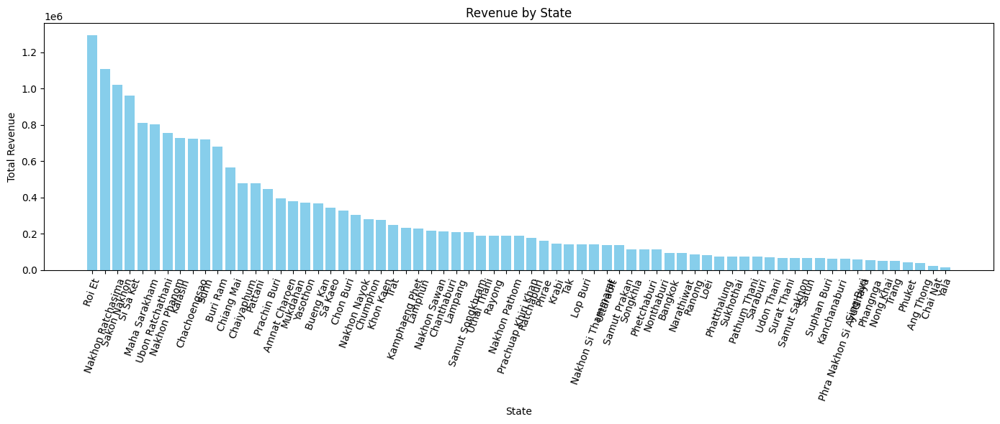

Preferred Channel (Origin) by Top 10 Customer State:
   Customer State Preferred Channel
           Roi Et       paid_search
Nakhon Ratchasima    organic_search
     Sakon Nakhon    organic_search
        Si Sa Ket    organic_search
    Maha Sarakham    organic_search
 Ubon Ratchathani    organic_search
    Nakhon Phanom       paid_search
          Kalasin    organic_search
     Chachoengsao    organic_search
            Surin    organic_search
         Buri Ram       paid_search
       Chiang Mai    organic_search
       Chaiyaphum    organic_search
          Pattani    organic_search
     Prachin Buri    organic_search
    Amnat Charoen    organic_search
         Mukdahan           unknown
         Yasothon    organic_search
        Bueng Kan       paid_search
          Sa Kaeo    organic_search


In [249]:
# Calculate total_payment (sum of payment_value per order)

df_delivered_region = df_delivered

df_delivered_region['total_payment'] = df_delivered_region.groupby('order_id')['payment_value'].transform('sum')
regional_perf = df_delivered_region.groupby('customer_state', as_index=False).agg({
    'total_payment': 'sum',
    'order_id':'nunique'
})
regional_perf.rename(columns={
    'total_payment':'total_revenue',
    'order_id':'num_orders'
}, inplace=True)
regional_perf['avg_order_value'] = regional_perf['total_revenue'] / regional_perf['num_orders']
regional_perf.sort_values('total_revenue', ascending=False, inplace=True)

print("Top states by total revenue:")
print(regional_perf.head(10))

# ------------ Plot the States ---------
# Plot top states by total_revenue
plt.figure(figsize=(14, 6))
plt.bar(regional_perf['customer_state'], regional_perf['total_revenue'], color = 'skyblue')
plt.xlabel("State")
plt.ylabel("Total Revenue")
plt.title("Revenue by State")
plt.xticks(rotation=70)
plt.tight_layout()
plt.show()

# -------- Channel (Origin) of each mql ------------

df_merged = pd.merge(df_delivered_region, df_mql_closed, on='seller_id', how='left')
df_merged = df_merged.groupby('order_id').first().reset_index()
top_states = regional_perf.sort_values('total_revenue', ascending=False).head(20)['customer_state'].tolist()
preferred_channels_by_state = {}
for state in top_states:
  df_state = df_merged[df_merged['customer_state'] == state]
  if not df_state.empty:
    preferred_channel = df_state.groupby('origin')['seller_id'].nunique().idxmax()
    preferred_channels_by_state[state] = preferred_channel

# Create a DataFrame from the dictionary
preferred_channels_df = pd.DataFrame(list(preferred_channels_by_state.items()), columns=['Customer State', 'Preferred Channel'])

# Display the DataFrame as a table
print("Preferred Channel (Origin) by Top 10 Customer State:")
print(preferred_channels_df.to_string(index=False))


Marketing Strategy Insights:

- Focus on top 10 categories with a specialized marketing approach.

- For states with moderate revenue but high growth potential, maintain brand presence but shift budgets to states showing accelerating demand.

# COO Challenge

## On-Time Delivery Performance Analysis
**Use df_delivered_region for all delivered records**

In [245]:
print(df_delivered_region.head(10).to_string())

                           order_id                        product_id   price  freight_value  payment_value order_status order_purchase_timestamp    order_approved_at order_delivered_carrier_date order_delivered_customer_date order_estimated_delivery_date  shipping_limit_date                       customer_id                customer_unique_id customer_zip_code_prefix    customer_city     customer_state                         seller_id seller_zip_code_prefix      seller_city  seller_state  review_score                                                                                                                                                           review_comment_message product_category_name_english  total_payment
0  00010242fe8c5a6d1ba2dd792cb16214  4244733e06e7ecb4970a6e2683c13e61   58.90          13.29          72.19    delivered      2017-09-13 08:59:00  2017-09-13 09:45:00          2017-09-19 18:34:00           2017-09-20 23:43:00                    2017-09-29  2017-09-19 09

In [252]:
df_delivered_region2 = df_delivered_region.copy()
# Define a custom function to parse dates with missing time component
def parse_estimated_date(date_str):
  return pd.to_datetime(date_str, format='%Y-%m-%d', errors='coerce')
df_delivered_region2['order_estimated_delivery_date'] = df_delivered_region2['order_estimated_delivery_date'].apply(parse_estimated_date)
df_delivered_region2['order_delivered_customer_date'] = pd.to_datetime(df_delivered_region2['order_delivered_customer_date'], errors='coerce')

# Identify if an order is actually late
df_delivered_region2['is_late'] = df_delivered_region2['order_delivered_customer_date'] > df_delivered_region2['order_estimated_delivery_date']
late_ratio = df_delivered_region2['is_late'].mean()

# Calculate average delivery time only for delivered orders
df_delivered_region2['delivery_time_days'] = pd.to_numeric(df_delivered_region2['delivery_time_days'], errors='coerce')
avg_delivery_time = df_delivered_region2['delivery_time_days'].mean()
print("Overall Late Delivery Ratio:", late_ratio)
print("-----------------------------------------------")
print("\nOverall Average Delivery Time (days):", avg_delivery_time)

# Per State
state_late_perf = df_delivered_region2.groupby('customer_state', as_index=False).agg({
    'is_late':'mean',
    'delivery_time_days':'mean',
    'order_id': 'count'  # Count the number of orders per state
}).rename(columns={'is_late':'late_ratio','delivery_time_days':'avg_delivery_days', 'order_id': 'order_count'})
state_late_perf.sort_values('order_count', ascending=False, inplace=True)  # Sort by order count
print("-----------------------------------------------")
print("\nStates with highest order count and late ratio:")
print(state_late_perf.head(20).to_string(index=False))


Overall Late Delivery Ratio: 0.08111693857667032
-----------------------------------------------

Overall Average Delivery Time (days): 12.09402923188556
-----------------------------------------------

States with highest order count and late ratio:
   customer_state  late_ratio  avg_delivery_days  order_count
           Roi Et    0.080914          11.954113         5994
Nakhon Ratchasima    0.078806          11.900983         5393
     Sakon Nakhon    0.088338          12.477147         4879
        Si Sa Ket    0.073291          11.694017         4680
    Maha Sarakham    0.094053          12.343867         4019
 Ubon Ratchathani    0.080854          12.702696         3933
    Nakhon Phanom    0.081214          11.884765         3854
          Kalasin    0.086217          12.609933         3584
     Chachoengsao    0.077453          12.100975         3486
         Buri Ram    0.082474          11.802946         3395
            Surin    0.082273          11.894939         3379
     

In [253]:
# Group by seller_id and calculate the late delivery ratio
seller_late_performance = df_delivered_region2.groupby('seller_id').agg(
    late_ratio=('is_late', 'mean'),
    order_count=('order_id', 'count')
).sort_values(['order_count', 'late_ratio'], ascending=[False, True])

# Display the top 10 sellers with the highest late delivery ratio and order count
print("Top 10 Sellers with Consistent Late Deliveries:")
print(seller_late_performance.head(10))

# Group by customer_state and calculate the late delivery ratio
state_late_performance = df_delivered_region2.groupby('seller_state').agg(
    late_ratio=('is_late', 'mean'),
    order_count=('order_id', 'count')
).sort_values(['order_count', 'late_ratio'], ascending=[False, False])

# Display the top 10 states with the highest late delivery ratio and order count
print("-----------------------------------------------")
print("\nTop 10 Seller States with Consistent Late Deliveries:")
print(state_late_performance.head(10))


Top 10 Sellers with Consistent Late Deliveries:
                                  late_ratio  order_count
seller_id                                                
6560211a19b47992c3666cc44a7e94c0    0.064124         1809
4a3ca9315b744ce9f8e9374361493884    0.112399         1726
cc419e0650a3c5ba77189a1882b7556a    0.061286         1648
1f50f920176fa81dab994f9023523100    0.106936         1384
da8622b14eb17ae2831f4ac5b9dab84a    0.077220         1295
955fee9216a65b617aa5c0531780ce60    0.078088         1255
7a67c85e85bb2ce8582c35f2203ad736    0.059912         1135
ea8482cd71df3c1969d7b9473ff13abc    0.105169         1122
4869f7a5dfa277a7dca6462dcf3b52b2    0.116383         1117
3d871de0142ce09b7081e2b9d1733cb1    0.059886         1052
-----------------------------------------------

Top 10 Seller States with Consistent Late Deliveries:
                   late_ratio  order_count
seller_state                              
Si Sa Ket            0.091077        14636
Surin                0.0

### Correlation Between Freight Values and Delivery Time

Correlation between Freight Value and Delivery Time: 0.21333564501871471


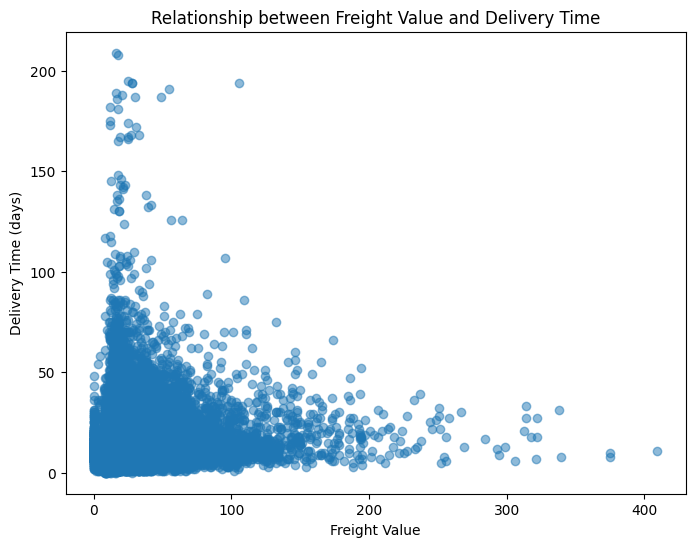

In [254]:
# Check the correlation between freight_value and delivery time
correlation = df_delivered_region2['freight_value'].corr(df_delivered_region2['delivery_time_days'])
print("Correlation between Freight Value and Delivery Time:", correlation)

# Analyze the relationship using a scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(df_delivered_region2['freight_value'], df_delivered_region2['delivery_time_days'], alpha=0.5)
plt.xlabel("Freight Value")
plt.ylabel("Delivery Time (days)")
plt.title("Relationship between Freight Value and Delivery Time")
plt.show()


In [255]:
# Group by freight value ranges and calculate the average delivery time for each range.
freight_range_delivery_time = df_delivered_region2.copy()
freight_range_delivery_time['freight_range'] = pd.cut(freight_range_delivery_time['freight_value'], bins=10)
freight_range_delivery_time = freight_range_delivery_time.groupby('freight_range')['delivery_time_days'].mean().reset_index()

# Investigate if there's a relationship between higher freight value and the likelihood of late delivery.
freight_late_delivery = df_delivered_region2.copy()
freight_late_delivery['freight_range'] = pd.cut(freight_late_delivery['freight_value'], bins=10)
freight_late_delivery = freight_late_delivery.groupby('freight_range')['is_late'].mean().reset_index()

# Combine the late delivery likelihood with average delivery time by freight value range
combined_freight_analysis = pd.merge(freight_range_delivery_time, freight_late_delivery, on='freight_range')
print("\nCombined Analysis of Freight Value, Delivery Time, and Late Delivery:")
combined_freight_analysis



Combined Analysis of Freight Value, Delivery Time, and Late Delivery:


<ipython-input-255-abf4452fba52>:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

<ipython-input-255-abf4452fba52>:9: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,freight_range,delivery_time_days,is_late
0,"(-0.41, 40.968]",11.794646,0.079266
1,"(40.968, 81.936]",16.238058,0.104580
2,"(81.936, 122.904]",16.794271,0.105469
3,"(122.904, 163.872]",19.223301,0.199029
4,"(163.872, 204.84]",19.567568,0.162162
5,"(204.84, 245.808]",18.958333,0.125000
6,"(245.808, 286.776]",19.333333,0.000000
7,"(286.776, 327.744]",17.363636,0.000000
8,"(327.744, 368.712]",19.500000,0.000000
9,"(368.712, 409.68]",9.666667,0.000000


In [278]:
df_mql_closed = pd.read_csv("/content/df_mql_closed.csv")

In [283]:
df_mql_closed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 841 entries, 0 to 840
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   mql_id                         841 non-null    object 
 1   first_contact_date             841 non-null    object 
 2   landing_page_id                841 non-null    object 
 3   origin                         841 non-null    object 
 4   seller_id                      841 non-null    object 
 5   sdr_id                         841 non-null    object 
 6   sr_id                          841 non-null    object 
 7   won_date                       841 non-null    object 
 8   business_segment               841 non-null    object 
 9   lead_type                      841 non-null    object 
 10  lead_behaviour_profile         841 non-null    object 
 11  has_company                    841 non-null    bool   
 12  average_stock                  841 non-null    obj

In [279]:
print(df_mql_closed.head(30).to_string())

                              mql_id first_contact_date                   landing_page_id          origin                         seller_id                            sdr_id                             sr_id             won_date                 business_segment        lead_type lead_behaviour_profile  has_company average_stock business_type_org declared_product_catalog_size declared_monthly_revenue  lead_closure_time  is_deal_closed
0   5420aad7fec3549a85876ba1c529bd84         2018-02-21  b48ec5f3b04e9068441002a19df93c6c  organic_search  2c43fb513632d29b3b58df74816f1b06  a8387c01a09e99ce014107505b92388c  4ef15afb4b2723d8f3d81e51ec7afefe  2018-02-26 19:58:00                              pet    online_medium        captain_america        False     above 100          reseller                           400                    3,000                5.0            True
1   a555fb36b9368110ede0f043dfc3b9a0         2018-04-04  2f08471dfb83baef522f952438a36f6e        referral  bbb7d7893a450660432

## 2. Optimizing SDR/SR for Seller Recruitment

In [287]:
# Group by SDR and SR
productivity = (
    df_mql_closed
    .groupby(['sdr_id', 'sr_id'])
    .agg(
        total_leads=('mql_id', 'count'),
        converted_leads=('is_deal_closed', lambda x: x.sum()),
        avg_declared_revenue=('declared_monthly_revenue', lambda x: x.mean())
    )
    .reset_index()
)

print(productivity.sort_values('converted_leads', ascending=False).head(10).to_string())



                               sdr_id                             sr_id  total_leads  converted_leads  avg_declared_revenue
94   4b339f9567d060bcea4f5136b9f5949e  4ef15afb4b2723d8f3d81e51ec7afefe           21               21           5809.523810
187  de63de0d10a6012430098db33c679b0b  d3d1e91a157ea7f90548eef82f1955e3           19               19           4052.631579
96   4b339f9567d060bcea4f5136b9f5949e  6565aa9ce3178a5caf6171827af3a9ba           18               18           5055.555556
183  de63de0d10a6012430098db33c679b0b  4ef15afb4b2723d8f3d81e51ec7afefe           16               16           5625.000000
110  56bf83c4bb35763a51c2baab501b4c67  4ef15afb4b2723d8f3d81e51ec7afefe           16               16           3750.000000
105  4b339f9567d060bcea4f5136b9f5949e  fbf4aef3f6915dc0c3c97d6812522f6a           14               14           5642.857143
103  4b339f9567d060bcea4f5136b9f5949e  d3d1e91a157ea7f90548eef82f1955e3           14               14           4000.000000
115  56b

In [289]:
# SDR/SR operation (df_mql_closed)
print("\nAverage lead_closure_time:", df_mql_closed['lead_closure_time'].mean())
origin_perf = (
    df_mql_closed.groupby('origin', as_index=False)
    .agg({'lead_closure_time':'mean', 'is_deal_closed': 'sum'})  # Aggregate lead_closure_time and count deal closed
    .rename(columns={'lead_closure_time':'avg_closure_days', 'is_deal_closed': 'deals_closed'})
    .sort_values('avg_closure_days', ascending=True)
)
print("\n[Lead closure time by origin]")
print(origin_perf.to_string(index=False))



Average lead_closure_time: 48.500594530321045

[Lead closure time by origin]
           origin  avg_closure_days  deals_closed
          display         10.333333             6
            other         15.250000             4
   direct_traffic         31.125000            56
         referral         32.541667            24
other_publicities         39.333333             3
          unknown         41.865285           193
   organic_search         50.192593           270
            email         52.200000            15
      paid_search         56.600000           195
           social         60.960000            75


<ipython-input-290-f925c8ea3087>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




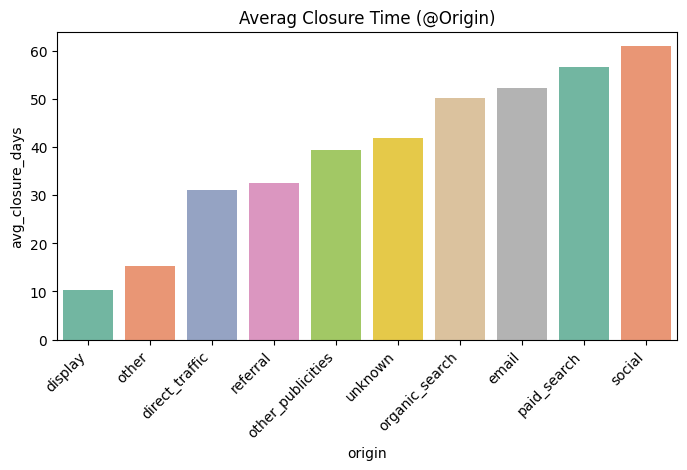

In [290]:
# Visualisation
plt.figure(figsize=(8,4))
sns.barplot(data=origin_perf, x='origin', y='avg_closure_days', palette='Set2')
plt.title('Averag Closure Time (@Origin)')
plt.xticks(rotation=45, ha='right')
plt.show()


The most frequent lead behavior profile is 'captain_america' with a count of 406.


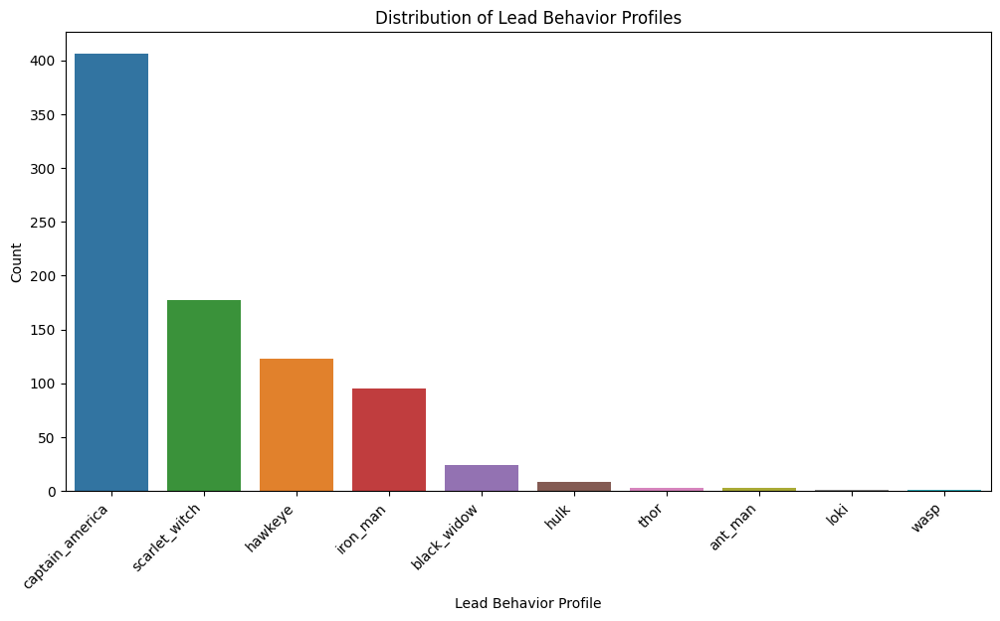

In [ ]:
# Lead behavior profile with the highest count
lead_behavior_counts = df_mql_closed['lead_behaviour_profile'].value_counts()
max_lead_behavior = lead_behavior_counts.index[0]
max_count = lead_behavior_counts.iloc[0]

print(f"The most frequent lead behavior profile is '{max_lead_behavior}' with a count of {max_count}.")

# Visualize lead behavior profile distribution
plt.figure(figsize=(12, 6))
sns.countplot(x='lead_behaviour_profile', data=df_mql_closed, order=df_mql_closed['lead_behaviour_profile'].value_counts().index, hue='lead_behaviour_profile')
plt.title('Distribution of Lead Behavior Profiles')
plt.xlabel('Lead Behavior Profile')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right') # Rotate x-axis labels for better readability
plt.show()


In [ ]:
lead_behavior_by_origin = df_mql_closed.groupby(['origin', 'lead_behaviour_profile']).size().reset_index(name='count')

fig = px.bar(
    lead_behavior_by_origin,
    x='origin',
    y='count',
    color='lead_behaviour_profile',
    barmode='group',
    labels={'origin': 'Origin', 'count': 'Number of Leads', 'lead_behaviour_profile': 'Lead Behavior Profile'},
    title='Distribution of Lead Behavior Profiles by Origin'
)
fig.show()


Business Types for Each L.Behaviour Profile

In [ ]:
lead_behavior_business_type = df_mql_closed.groupby(['lead_behaviour_profile', 'business_type_org']).size().reset_index(name='count')

fig = px.bar(
    lead_behavior_business_type,
    x='lead_behaviour_profile',
    y='count',
    color='business_type_org',
    barmode='group',
    labels={'lead_behaviour_profile': 'Lead Behavior Profile', 'count': 'Count', 'business_type_org': 'Business Type'},
    title='Distribution of Business Types for Each Lead Behavior Profile'
)
fig.show()


- Shortest Lead Closure:

Assign them to less experienced SDRs/SRs because those leads likely close quickly with fewer obstacles.
Or funnel more of these leads to the queue so you can capture quick wins efficiently.

- Longest Lead Closure:

Assign these to your most skilled or most patient SDR/SRs, capable of nurturing long-cycle leads.
Possibly refine the messaging or approach to speed up closure.